In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Yeah, I want a clean file for this

In [2]:
def sing_col_analysis(target, col_anal=12):
    #target += 1
    name = df.columns[target]
    print(f"{name} is a {df.dtypes[target]} that has {len(df[name].unique())} unique and {df[name].isnull().sum()} null values.")
    #insert line about outliers? Well, could potentially add to the table if relevant.... hmm guess we'll see
    print(df[name].describe())
    curr_col_analysis = df[name].value_counts().reset_index()
    curr_col_analysis['proportion'] = round(df[name].value_counts(normalize=True).reset_index()['proportion'], 3)
    print(curr_col_analysis[:min(col_anal, curr_col_analysis.shape[0])])

In [4]:
#Insert re. double col analysis

In [5]:
#insert re. double col graph

In [3]:
df = pd.read_csv('../data/all_monthly_data_clean.csv')
print(df.shape)
df.head()

(288, 47)


,year,month,population,unemployment_rate,hourly_earnings_yoy,cpi_yoy,shelter_yoy,energy_yoy,medical_care_yoy,food_yoy,...,personal_interest_payments,tax_other_to_government,tax_personal_current,tax_gov_social_insurance_domestic,tax_total_all_taxes,cc_rate_all_ns,mortgage_rate_30_yr,cc_bals_30d_due_percentage,cc_bals_90d_due_percentage,cc_balance_total_billions
0,2019,December,331345000.0,3.6,2.976407,2.285130,3.226840,3.437022,4.619287,1.807531,...,3.510450e+11,1.141310e+11,2.228563e+12,1.445443e+12,3.788137e+12,.,3.720,NaN,NaN,NaN
1,2019,November,331213000.0,3.6,3.316327,2.051278,3.315695,-0.590061,4.272018,2.000165,...,3.493480e+11,1.144740e+11,2.222931e+12,1.445227e+12,3.782632e+12,14.87,3.695,NaN,NaN,NaN
2,2019,October,331066000.0,3.6,3.142126,1.764043,3.355015,-4.166427,4.292580,2.073456,...,3.488320e+11,1.147100e+11,2.209687e+12,1.438320e+12,3.762717e+12,.,3.688,2.93,1.46,760.36
3,2019,September,330904000.0,3.5,3.111274,1.711305,3.506051,-4.751840,3.418900,1.788571,...,3.494810e+11,1.148640e+11,2.194830e+12,1.429200e+12,3.738894e+12,.,3.605,NaN,NaN,NaN
4,2019,August,330729000.0,3.6,3.419118,1.749780,3.352060,-4.389285,3.384868,1.705389,...,3.506330e+11,1.149560e+11,2.197049e+12,1.426682e+12,3.738687e+12,15.1,3.616,NaN,NaN,NaN


In [102]:
df.columns[df.columns.str.contains('cc')]

Index(['cc_rate_all_ns', 'cc_bals_30d_due_percentage',
       'cc_bals_90d_due_percentage', 'cc_balance_total_billions'],
      dtype='object')

In [60]:
df.dtypes[42], df.columns[42]

(dtype('O'), 'cc_rate_all_ns')

In [33]:
df[df.columns[28]][:2]

0    2.795200e+10
1    2.672600e+10
Name: unemployment_insurance, dtype: float64

In [7]:
for i in range(len(df.columns)):#Eh, we'll go with that.
    if df[df.columns[i]].isnull().sum() > 12:
        print(i, df[df.columns[i]].isnull().sum())
    

4 86
44 243
45 243
46 243


In [8]:
df.columns.get_loc('unemployment_insurance') #So it seems I'm supposed to start from here, if after the medis.... Fine.
#Who cares, let's do this!

28

In [110]:
df.corr(numeric_only=True)[df.columns[46]].reset_index().min()

index                        all_less_food_&_shelter_yoy
cc_balance_total_billions                      -0.549534
dtype: object

In [9]:
#Hmm, besides the groupby thing.... and of course the graphs.... let us see the correlation

In [4]:
def corr_looker(df, col_no, noes=.1, highs=.51): #The first formula of interest, the correlation looker
    if df[df.columns[col_no]].dtype != 'float64' or df[df.columns[col_no]].dtype != 'int64':
        corr_target = df.corr(numeric_only=True)
        print(f"{corr_target[df.columns[col_no]].min()} is {df.columns[col_no]}'s minimum correlation with {corr_target[df.columns[col_no]].reset_index().min()[0]}")
        print('~'*45)
        print(corr_target[corr_target[df.columns[col_no]].between(-noes, noes)][df.columns[col_no]])
        print('~'*45)
        print(corr_target[corr_target[df.columns[col_no]] > highs ][df.columns[col_no]])
        print('~'*45)
        print(corr_target[corr_target[df.columns[col_no]] < -highs ][df.columns[col_no]])
    else:
        print(f"{df.columns[col_no]} is not a number datatype.")

In [72]:
##Perhaps I should have elsewhere, but regardless:

corr_table = []
neg_corrs, sig_corrs = .1, .51
# for i in range(len(df.columns)):
#     #i
#     name = df.columns[i]
    

In [96]:
corr_df = df.corr(numeric_only=True)
corr_df.head()

,year,population,unemployment_rate,hourly_earnings_yoy,cpi_yoy,shelter_yoy,energy_yoy,medical_care_yoy,food_yoy,gasoline_yoy,...,total_all_personal_outlays,personal_interest_payments,tax_other_to_government,tax_personal_current,tax_gov_social_insurance_domestic,tax_total_all_taxes,mortgage_rate_30_yr,cc_bals_30d_due_percentage,cc_bals_90d_due_percentage,cc_balance_total_billions
year,1.000000,0.993074,-0.113904,0.617421,0.210276,0.351716,-0.061640,-0.610324,0.239797,-0.028970,...,0.969860,0.677534,0.982915,0.924391,0.956963,0.944237,-0.647558,-0.242591,-0.269070,0.807940
population,0.993074,1.000000,-0.154107,0.545719,0.144376,0.283372,-0.091659,-0.609689,0.173093,-0.053301,...,0.943714,0.641804,0.968624,0.888588,0.925395,0.910074,-0.640766,-0.214876,-0.257498,0.821190
unemployment_rate,-0.113904,-0.154107,1.000000,-0.290368,-0.428050,-0.727565,-0.210652,0.119006,-0.228208,-0.139272,...,-0.320127,-0.458979,-0.308975,-0.418540,-0.364900,-0.401422,-0.324767,-0.061295,0.086492,-0.549534
hourly_earnings_yoy,0.617421,0.545719,-0.290368,1.000000,0.496653,0.564938,0.130549,-0.060885,0.650596,0.067919,...,0.675786,0.496268,0.681942,0.721594,0.721584,0.727904,0.156939,-0.222969,-0.204402,0.546516
cpi_yoy,0.210276,0.144376,-0.428050,0.496653,1.000000,0.473088,0.813378,0.017462,0.709975,0.750454,...,0.363634,0.276731,0.301938,0.465848,0.350620,0.427259,0.252765,-0.291977,-0.330180,0.570270


In [97]:
neg_corrs, sig_corrs = .1, .5
for i in corr_df.columns:
    corr_df[i] = [1 if float(guy) > sig_corrs else guy for guy in corr_df[i]]
    corr_df[i] = [-1 if float(guy) < -sig_corrs else guy for guy in corr_df[i]]
    corr_df[i] = [0 if abs(float(guy)) < neg_corrs else guy for guy in corr_df[i]]
corr_df.head()

,year,population,unemployment_rate,hourly_earnings_yoy,cpi_yoy,shelter_yoy,energy_yoy,medical_care_yoy,food_yoy,gasoline_yoy,...,total_all_personal_outlays,personal_interest_payments,tax_other_to_government,tax_personal_current,tax_gov_social_insurance_domestic,tax_total_all_taxes,mortgage_rate_30_yr,cc_bals_30d_due_percentage,cc_bals_90d_due_percentage,cc_balance_total_billions
year,1.000000,1.000000,-0.113904,1.000000,0.210276,0.351716,0.000000,-1.000000,0.239797,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,-1.000000,-0.242591,-0.269070,1.0
population,1.000000,1.000000,-0.154107,1.000000,0.144376,0.283372,0.000000,-1.000000,0.173093,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,-1.000000,-0.214876,-0.257498,1.0
unemployment_rate,-0.113904,-0.154107,1.000000,-0.290368,-0.428050,-1.000000,-0.210652,0.119006,-0.228208,-0.139272,...,-0.320127,-0.458979,-0.308975,-0.418540,-0.36490,-0.401422,-0.324767,0.000000,0.000000,-1.0
hourly_earnings_yoy,1.000000,1.000000,-0.290368,1.000000,0.496653,1.000000,0.130549,0.000000,1.000000,0.000000,...,1.000000,0.496268,1.000000,1.000000,1.00000,1.000000,0.156939,-0.222969,-0.204402,1.0
cpi_yoy,0.210276,0.144376,-0.428050,0.496653,1.000000,0.473088,1.000000,0.000000,1.000000,1.000000,...,0.363634,0.276731,0.301938,0.465848,0.35062,0.427259,0.252765,-0.291977,-0.330180,1.0


In [98]:
#Hmm, now what? Cluster things to group them?
corr_df[corr_df[corr_df.columns[0]]==1][corr_df[corr_df.columns[0]]]

,year,population,unemployment_rate,hourly_earnings_yoy,cpi_yoy,shelter_yoy,energy_yoy,medical_care_yoy,food_yoy,gasoline_yoy,...,total_all_personal_outlays,personal_interest_payments,tax_other_to_government,tax_personal_current,tax_gov_social_insurance_domestic,tax_total_all_taxes,mortgage_rate_30_yr,cc_bals_30d_due_percentage,cc_bals_90d_due_percentage,cc_balance_total_billions
year,1.0,1.0,-0.113904,1.000000,0.210276,0.351716,0.000000,-1.000000,0.239797,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-1.000000,-0.242591,-0.269070,1.000000
population,1.0,1.0,-0.154107,1.000000,0.144376,0.283372,0.000000,-1.000000,0.173093,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-1.000000,-0.214876,-0.257498,1.000000
hourly_earnings_yoy,1.0,1.0,-0.290368,1.000000,0.496653,1.000000,0.130549,0.000000,1.000000,0.000000,...,1.000000,0.496268,1.000000,1.000000,1.000000,1.00000,0.156939,-0.222969,-0.204402,1.000000
total_personal_income,1.0,1.0,-0.262137,1.000000,0.327434,0.462759,0.000000,-1.000000,0.364917,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-0.463083,-0.266682,-0.278674,1.000000
total_employee_compensation,1.0,1.0,-0.335626,1.000000,0.355087,1.000000,0.000000,-1.000000,0.377504,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-0.412491,-0.198273,-0.249221,1.000000
wages_and_salaries_all,1.0,1.0,-0.346533,1.000000,0.369146,1.000000,0.000000,-1.000000,0.391735,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-0.393927,-0.199222,-0.250257,1.000000
wages_salaries_private_employees,1.0,1.0,-0.366028,1.000000,0.379948,1.000000,0.000000,-1.000000,0.398845,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-0.382527,-0.203551,-0.255674,1.000000
wages_salaries_government_employees,1.0,1.0,-0.199864,1.000000,0.284031,0.400905,0.000000,-1.000000,0.332475,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-0.466723,-0.161989,-0.203654,1.000000
employer_contributions_for_employee_pension_and_insurance_funds,1.0,1.0,-0.251701,1.000000,0.242918,0.377942,0.000000,-1.000000,0.262361,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-1.000000,-0.194980,-0.240231,1.000000
employer_contributions_for_government_social_insurance,1.0,1.0,-0.323136,1.000000,0.351043,1.000000,0.000000,-1.000000,0.375860,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,-0.415310,-0.178788,-0.235427,1.000000


In [91]:
abs(float(-0.113904))

0.113904

In [70]:
corr_df.head()

,year,population,unemployment_rate,hourly_earnings_yoy,cpi_yoy,shelter_yoy,energy_yoy,medical_care_yoy,food_yoy,gasoline_yoy,...,total_all_personal_outlays,personal_interest_payments,tax_other_to_government,tax_personal_current,tax_gov_social_insurance_domestic,tax_total_all_taxes,mortgage_rate_30_yr,cc_bals_30d_due_percentage,cc_bals_90d_due_percentage,cc_balance_total_billions
year,1.000000,0.993074,-0.113904,0.617421,0.210276,0.351716,-0.061640,-0.610324,0.239797,-0.028970,...,0.969860,0.677534,0.982915,0.924391,0.956963,0.944237,-0.647558,-0.242591,-0.269070,0.807940
population,0.993074,1.000000,-0.154107,0.545719,0.144376,0.283372,-0.091659,-0.609689,0.173093,-0.053301,...,0.943714,0.641804,0.968624,0.888588,0.925395,0.910074,-0.640766,-0.214876,-0.257498,0.821190
unemployment_rate,-0.113904,-0.154107,1.000000,-0.290368,-0.428050,-0.727565,-0.210652,0.119006,-0.228208,-0.139272,...,-0.320127,-0.458979,-0.308975,-0.418540,-0.364900,-0.401422,-0.324767,-0.061295,0.086492,-0.549534
hourly_earnings_yoy,0.617421,0.545719,-0.290368,1.000000,0.496653,0.564938,0.130549,-0.060885,0.650596,0.067919,...,0.675786,0.496268,0.681942,0.721594,0.721584,0.727904,0.156939,-0.222969,-0.204402,0.546516
cpi_yoy,0.210276,0.144376,-0.428050,0.496653,1.000000,0.473088,0.813378,0.017462,0.709975,0.750454,...,0.363634,0.276731,0.301938,0.465848,0.350620,0.427259,0.252765,-0.291977,-0.330180,0.570270


In [6]:
# def scatter_looker(df, col_no, unit):
#     unit *= 4
#     target_name = df.columns[col_no]
#     #target_plot = 'scatter'

#     plt.figure(figsize = (16,9))
    
#     try:
#         ax1 = plt.subplot(2, 2, 1)
#         ax1.scatter(df[df.columns[col_no]], df[df.columns[unit+0]])
#         ax1.set_title(f"{target_name} vs. {df.columns[unit+0]}")
#     except:
#         pass
    
#     try:
#         ax2 = plt.subplot(2, 2, 2)
#         ax2.scatter(df[df.columns[col_no]], df[df.columns[unit+1]])
#         ax2.set_title(f"{target_name} vs. {df.columns[unit+1]}")
#     except:
#         pass
    
#     try:
#         ax3 = plt.subplot(2, 2, 3)
#         ax3.scatter(df[df.columns[col_no]], df[df.columns[unit+2]])
#         ax3.set_title(f"{target_name} vs. {df.columns[unit+2]}")
#     except:
#         pass
    
#     try:
#         ax4 = plt.subplot(2, 2, 4)
#         ax4.scatter(df[df.columns[col_no]], df[df.columns[unit+3]])
#         ax4.set_title(f"{target_name} vs. {df.columns[unit+3]}")
#     except:
#         pass
    
#     plt.tight_layout();

In [12]:
def scatter_looker(df, target_col_no):
    cluster, remainder = len(df.columns)//4, len(df.columns)%4
    if remainder > 0:
        cluster += 1
    target_name = df.columns[target_col_no]
    #target_plot = 'scatter'
    
    for i in range(cluster):
        unit = i * 4
        print(f"Plots for the {i} cluster:")
        
        plt.figure(figsize = (16,9))
        
        try:
            ax1 = plt.subplot(2, 2, 1)
            ax1.scatter(df[df.columns[target_col_no]], df[df.columns[unit+0]])
            ax1.set_title(f"{target_name} vs. {df.columns[unit+0]}, the {unit+0}th column.")
        except:
            pass
        
        try:
            ax2 = plt.subplot(2, 2, 2)
            ax2.scatter(df[df.columns[target_col_no]], df[df.columns[unit+1]])
            ax2.set_title(f"{target_name} vs. {df.columns[unit+1]}")
        except:
            pass
        
        try:
            ax3 = plt.subplot(2, 2, 3)
            ax3.scatter(df[df.columns[target_col_no]], df[df.columns[unit+2]])
            ax3.set_title(f"{target_name} vs. {df.columns[unit+2]}, the {unit+2}th column.")
        except:
            pass
        
        try:
            ax4 = plt.subplot(2, 2, 4)
            ax4.scatter(df[df.columns[target_col_no]], df[df.columns[unit+3]])
            ax4.set_title(f"{target_name} vs. {df.columns[unit+3]}")
        except:
            pass
        
        plt.tight_layout();
        print('`'*26)
        print('`'*26)
#     while remainder > 0:
#         plt.figure(figsize = (16,9))
#         #Not as elegant, but it'll get the job done easly.
#         plt.scatter(df[df.columns[target_col_no]], df[df.columns[unit+0]])
#         plt.set_title(f"{target_name} vs. {df.columns[unit+0]}");
#         print('`'*26)
#         print('`'*26)
#         remainder -= 1

In [12]:
corr_looker(df, 28, highs=.51)

-0.35487841127410025 is unemployment_insurance's minimum correlation.
medical_care_yoy               0.015109
food_yoy                       0.025687
imports_yoy                   -0.037372
all_less_food_&_shelter_yoy   -0.042655
personal_interest_payments    -0.079631
Name: unemployment_insurance, dtype: float64
unemployment_insurance    1.0
Name: unemployment_insurance, dtype: float64
Series([], Name: unemployment_insurance, dtype: float64)


In [18]:
test = .51
print(-test)

-0.51


Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


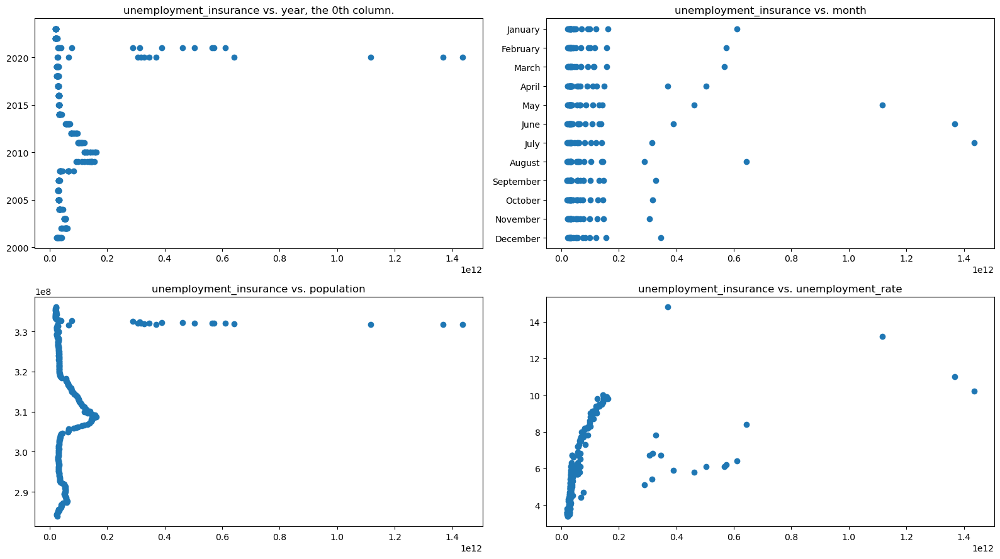

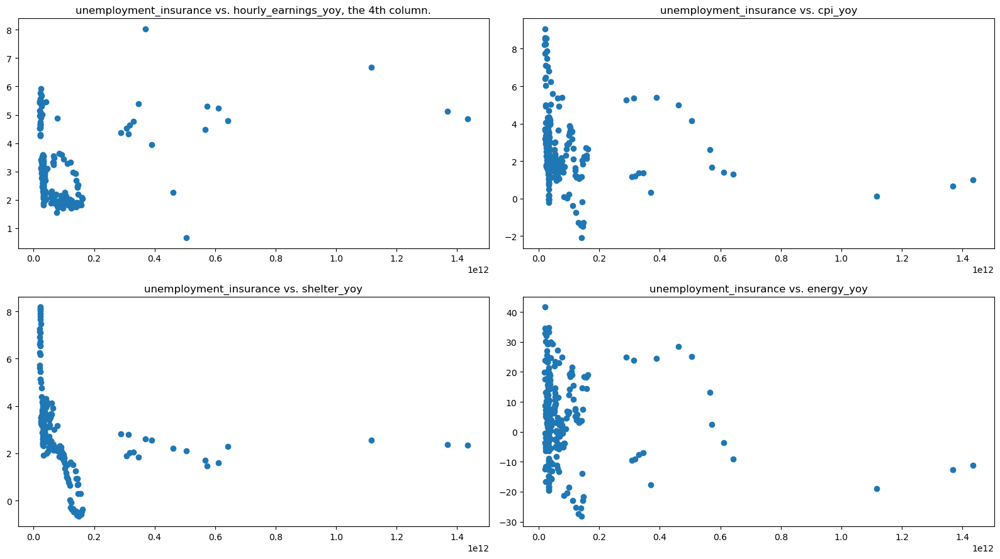

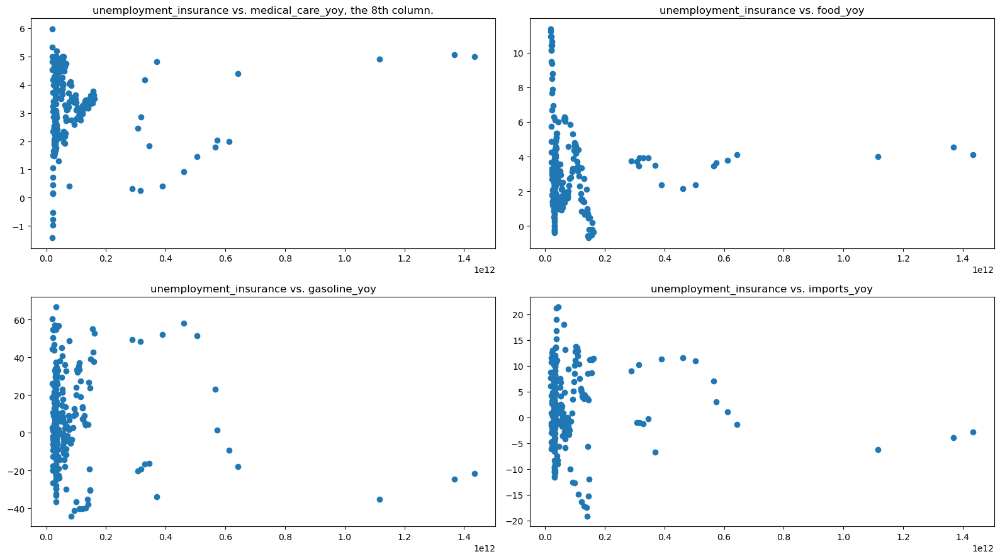

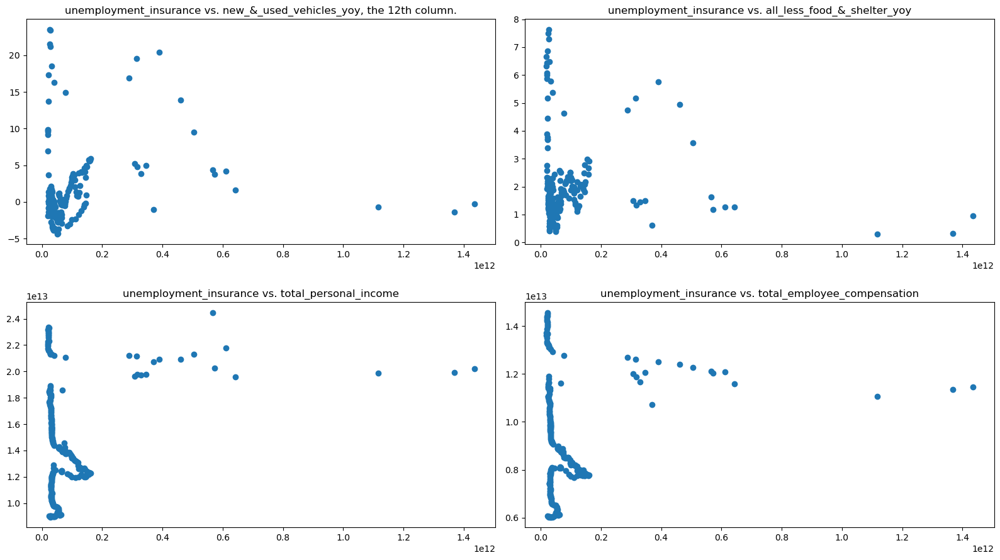

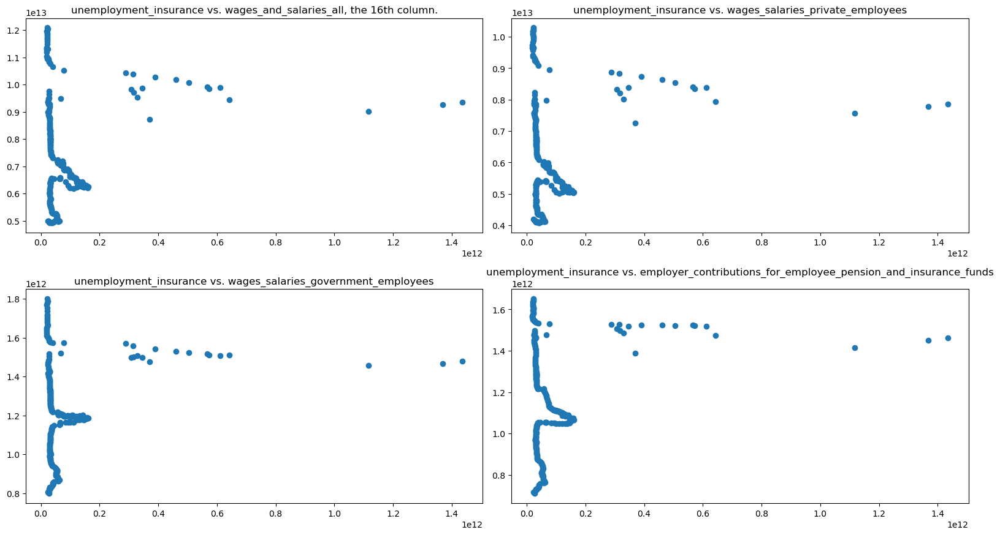

...

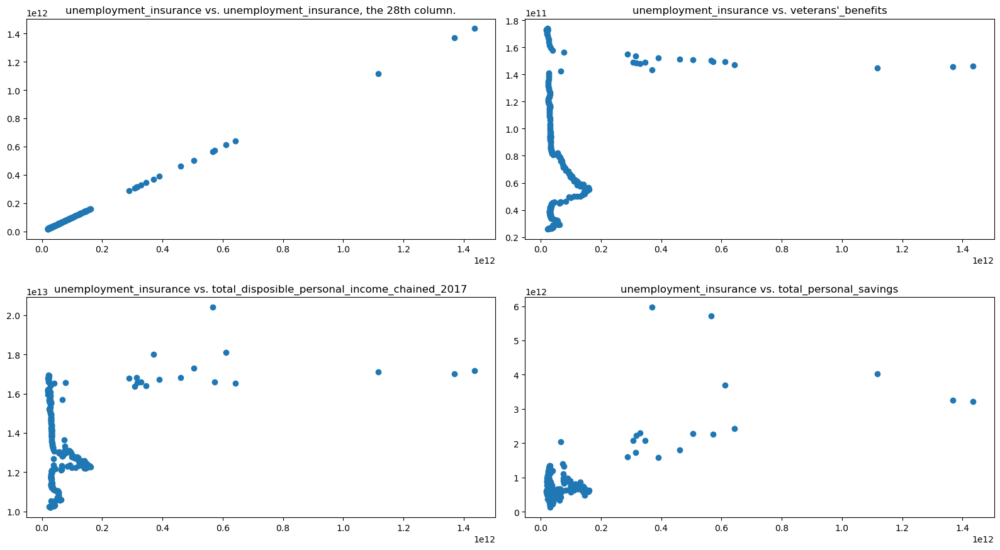

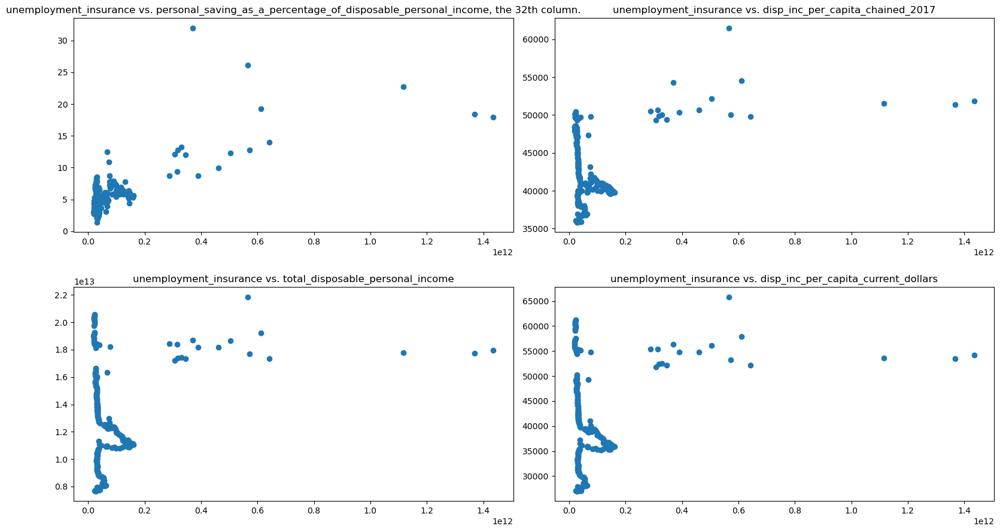

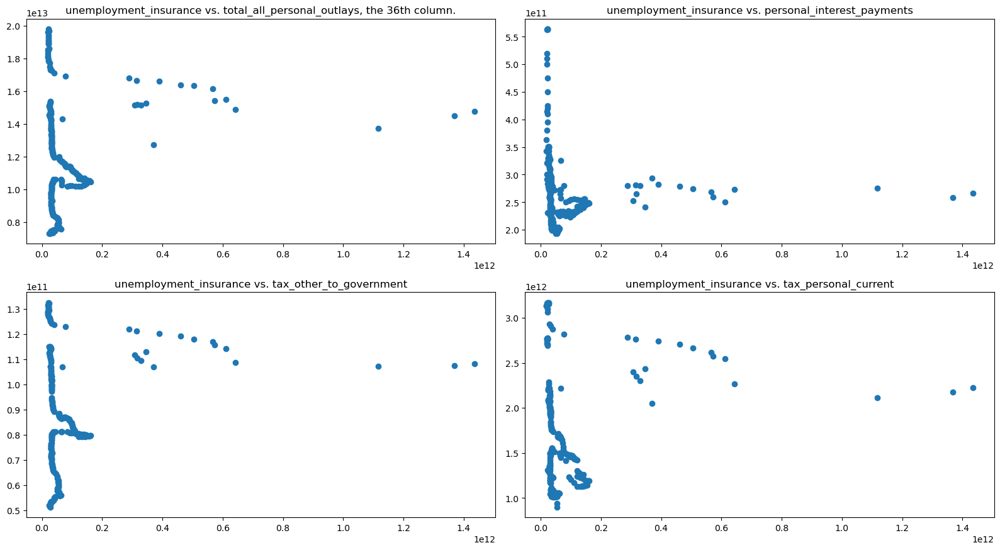

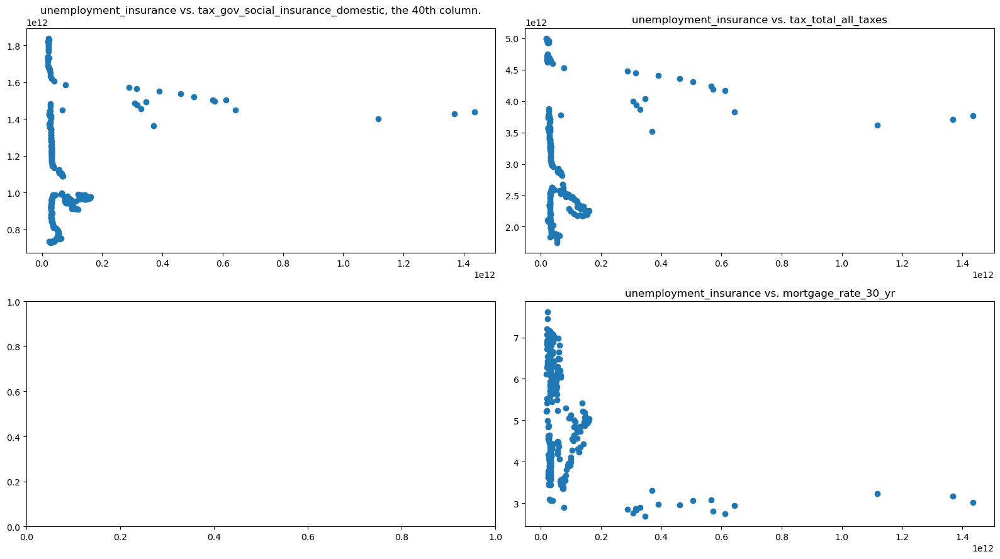

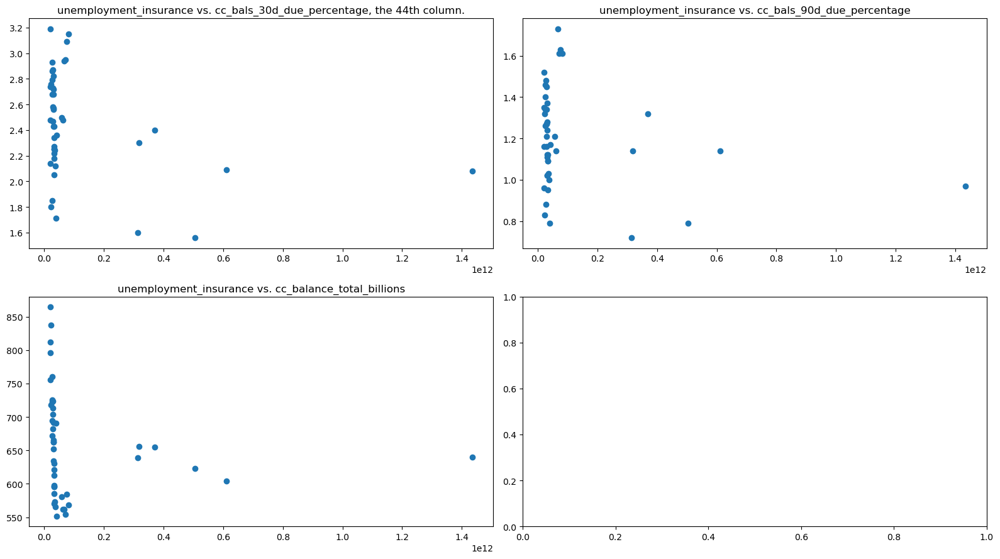

In [8]:
scatter_looker(df, 28)

In [20]:
corr_looker(df, 29, highs=.51)

-0.5645576014130886 is veterans'_benefits's minimum correlation.
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.009320
gasoline_yoy    0.008886
imports_yoy    -0.045859
Name: veterans'_benefits, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.970381
population                                                         0.941327
hourly_earnings_yoy                                                0.697979
total_personal_income                                              0.989893
total_employee_compensation                                        0.987759
wages_and_salaries_all                                             0.987103
wages_salaries_private_employees                                   0.986765
wages_salaries_government_employees                                0.968062
employer_contributions_for_employee_pension_and_insurance_funds    0.971081
employer_contributions_for_government_socia

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


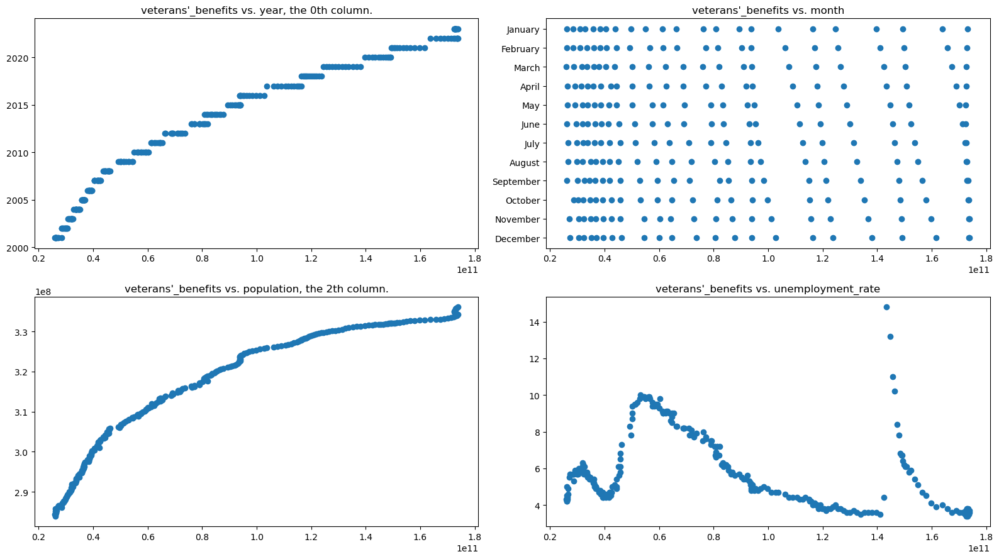

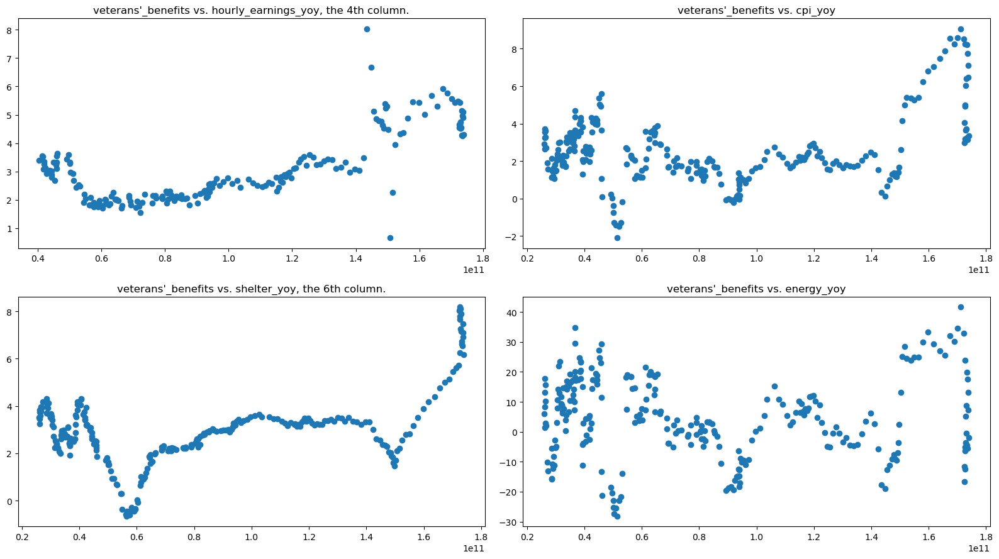

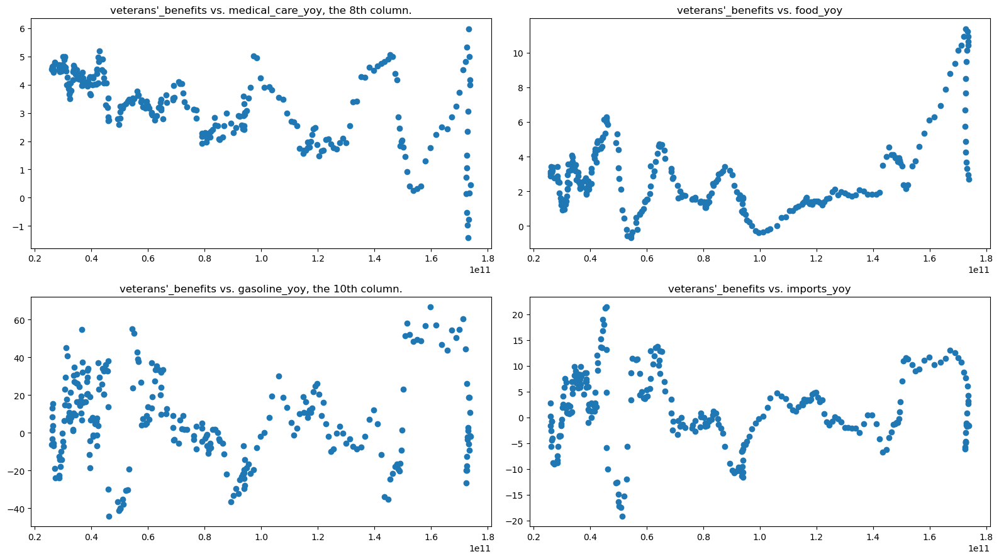

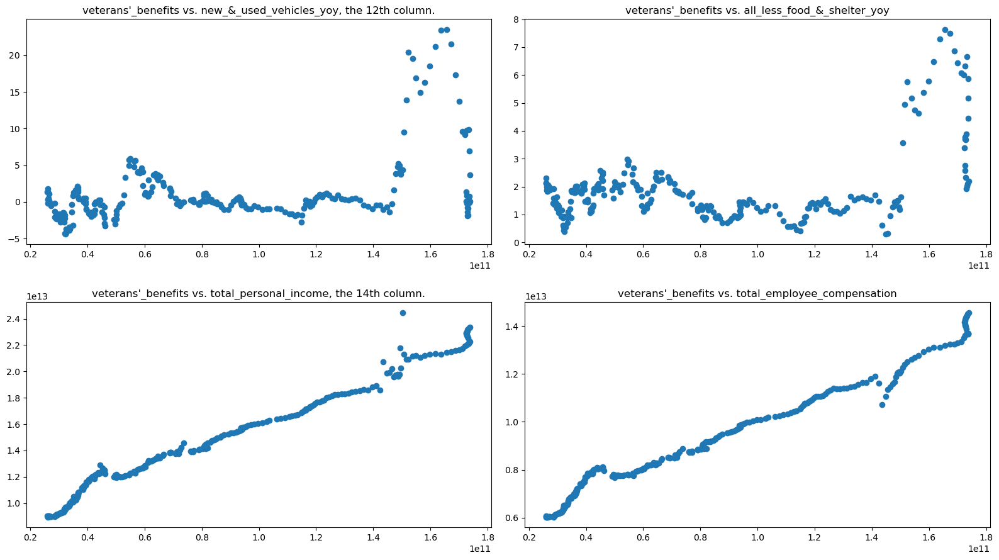

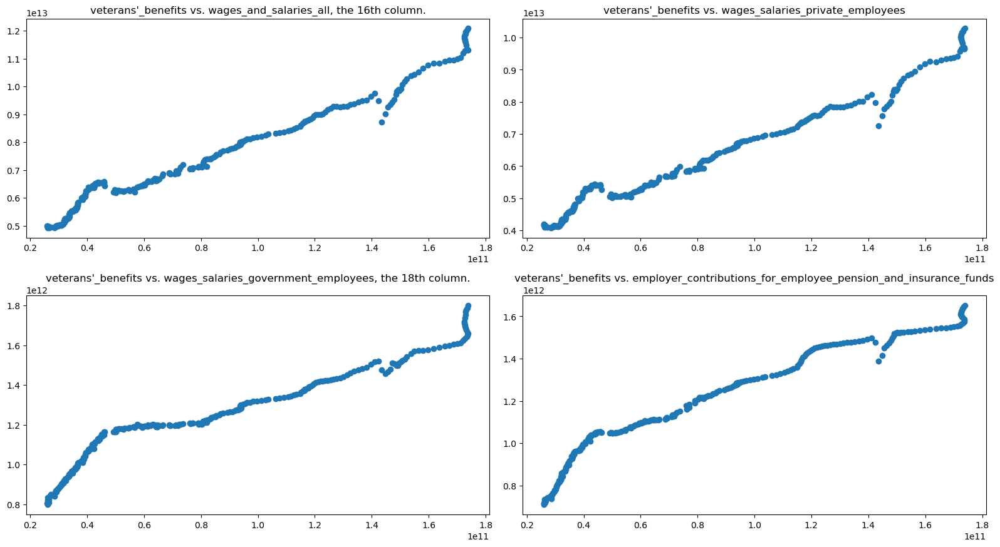

...

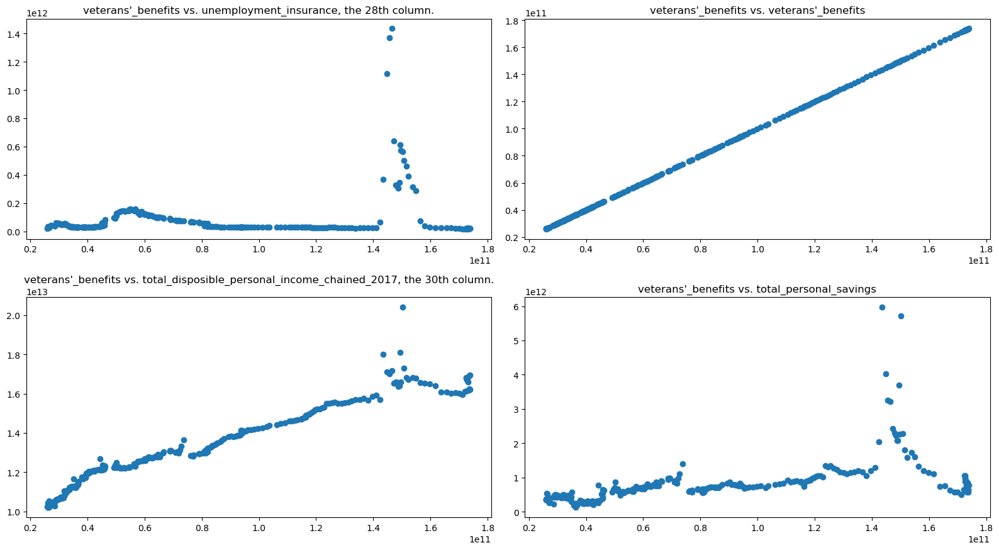

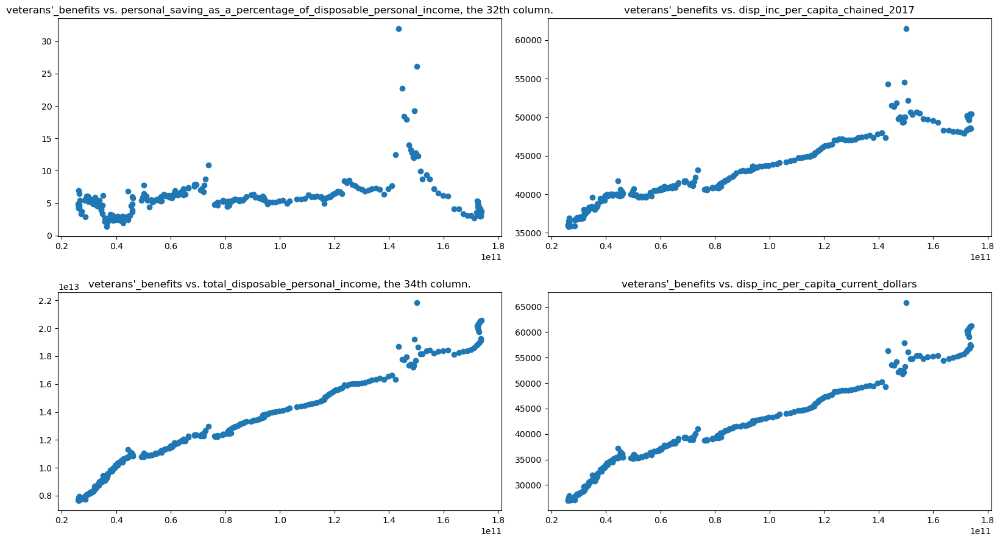

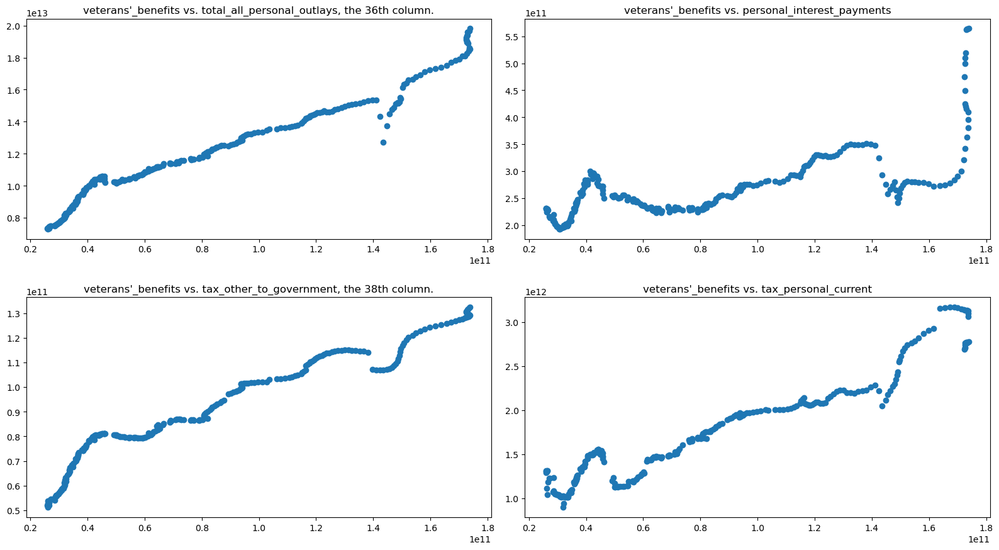

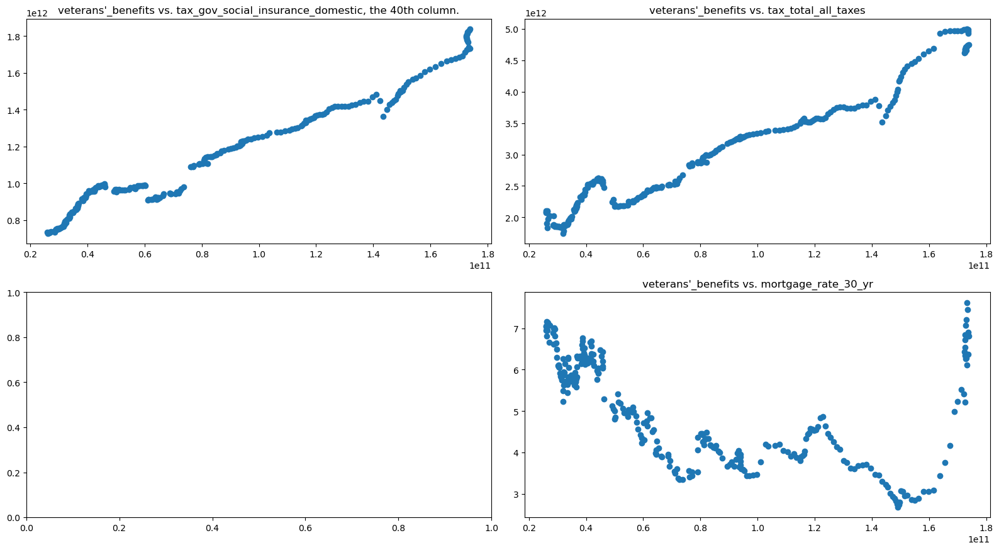

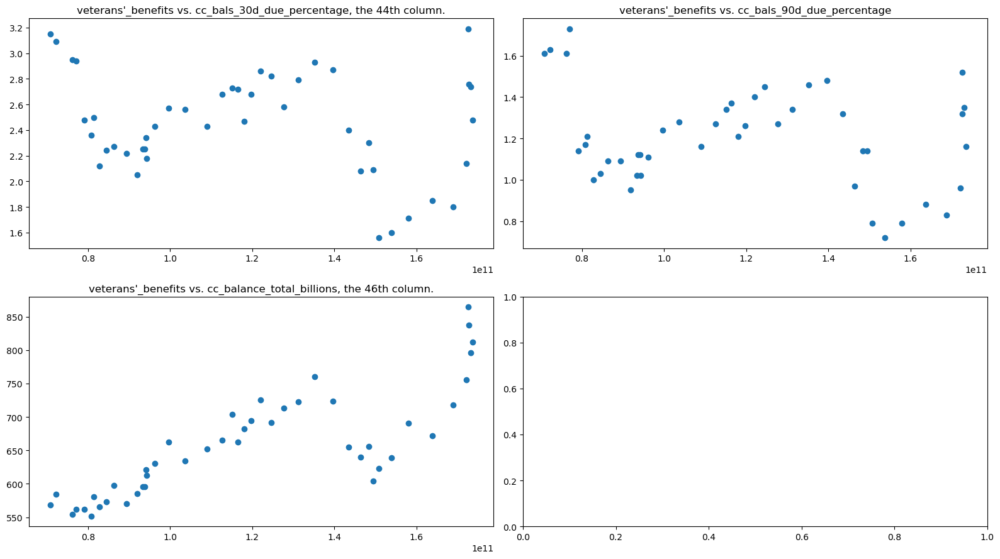

In [13]:
scatter_looker(df, 29)

In [35]:
corr_looker(df, 30, highs=.51)

-0.5749273689613441 is total_disposible_personal_income_chained_2017's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.044288
gasoline_yoy   -0.014462
imports_yoy    -0.033159
Name: total_disposible_personal_income_chained_2017, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.970471
population                                                         0.953178
hourly_earnings_yoy                                                0.700889
total_personal_income                                              0.983900
total_employee_compensation                                        0.962495
wages_and_salaries_all                                             0.958447
wages_salaries_private_employees                                   0.955045
wages_salaries_government_employees                                0.961895
employer_contributions_for_employ

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


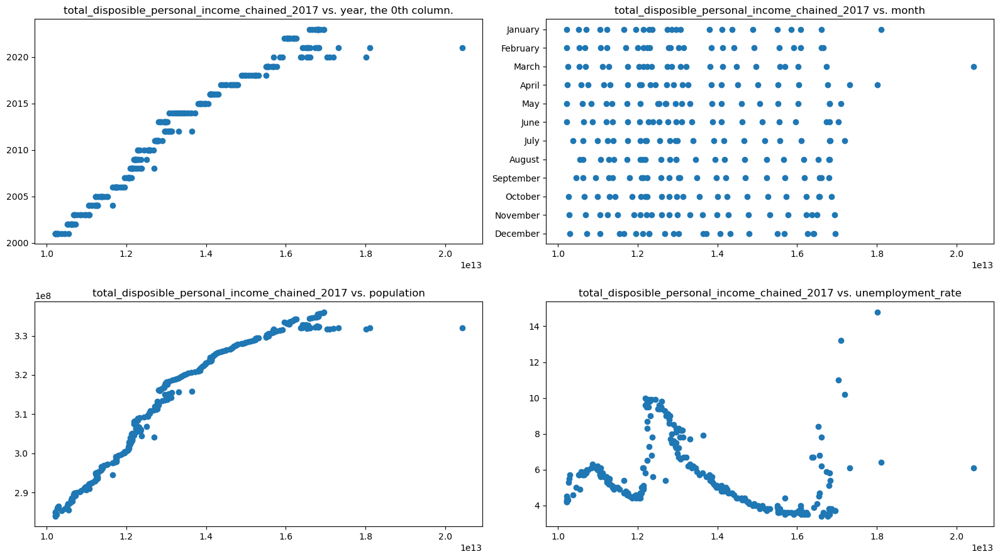

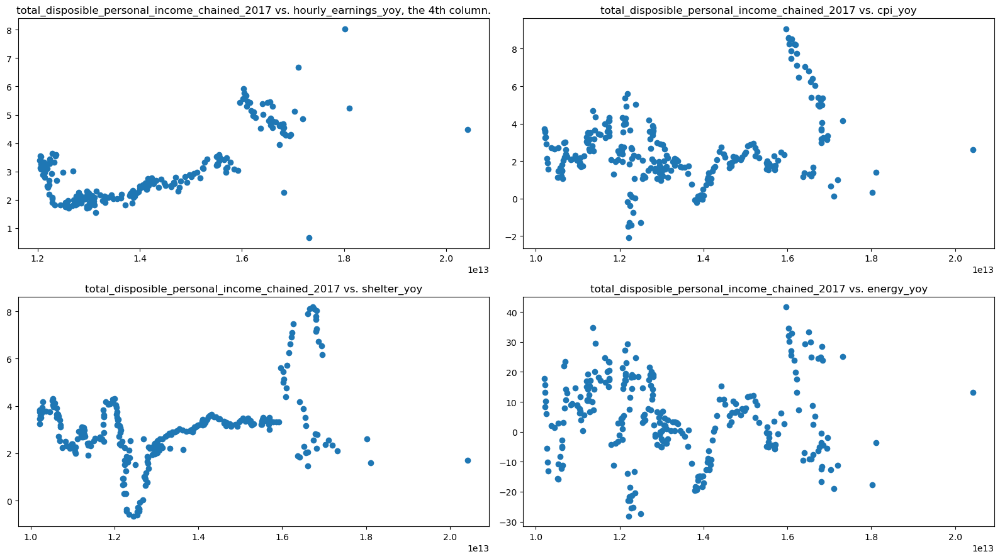

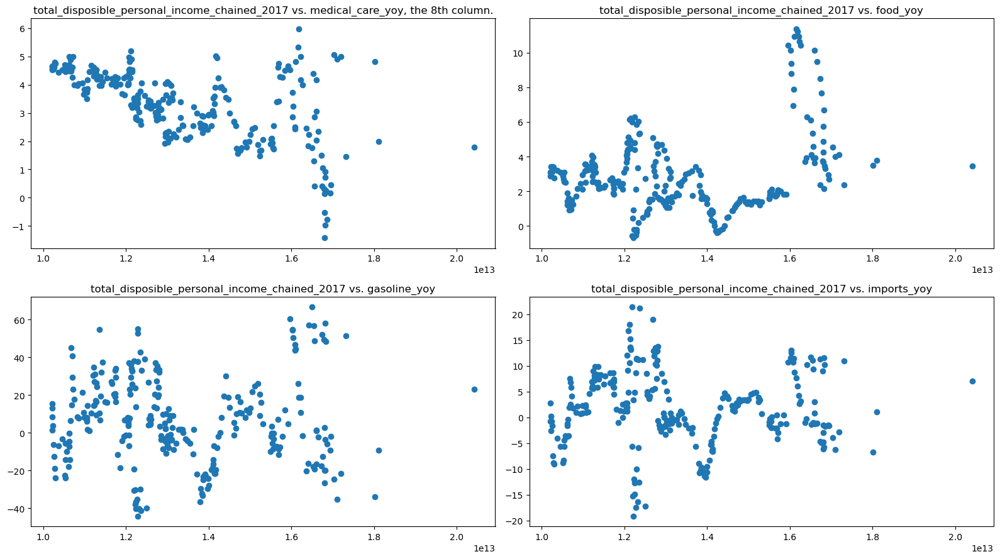

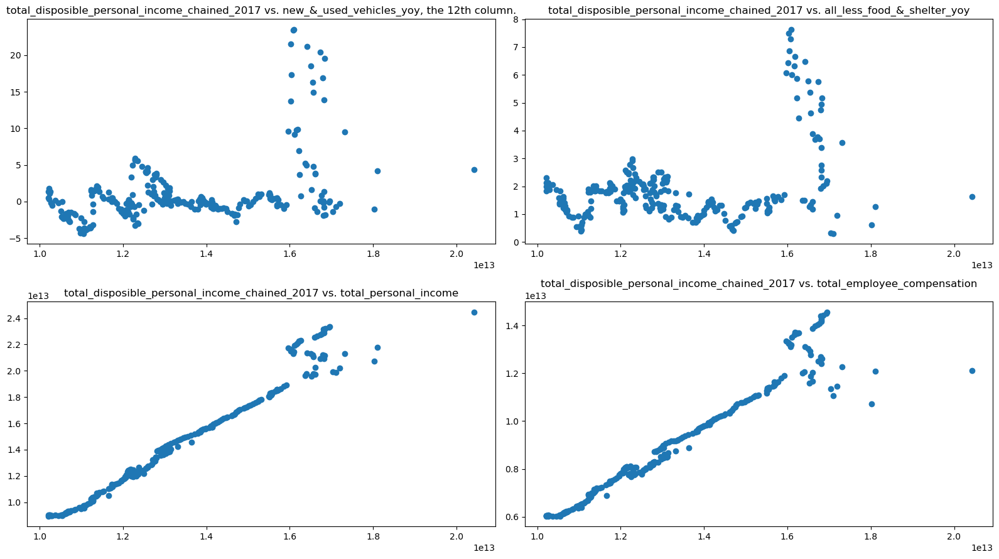

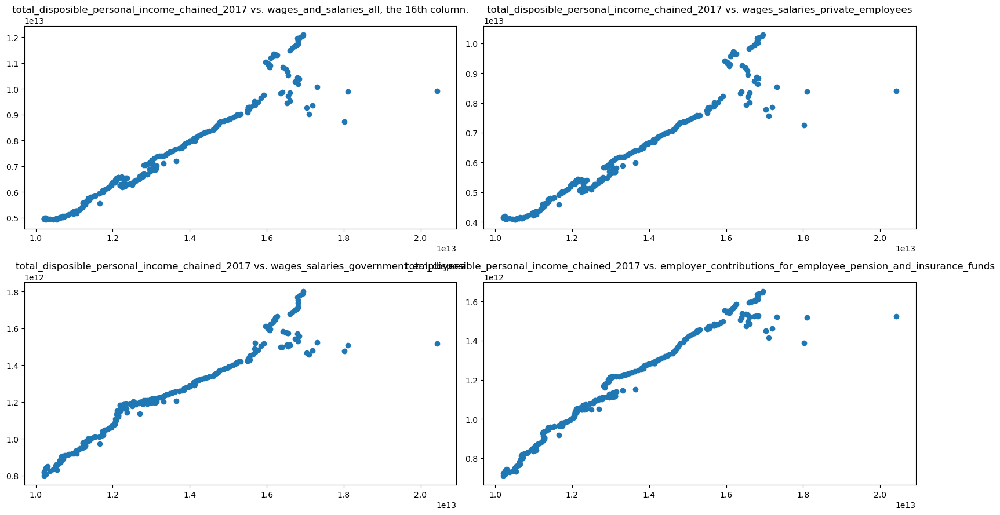

...

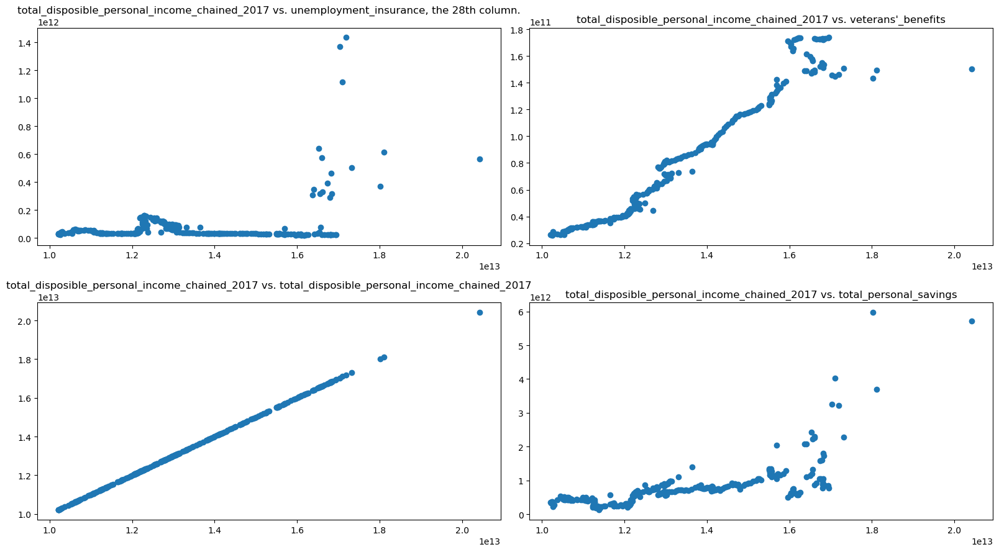

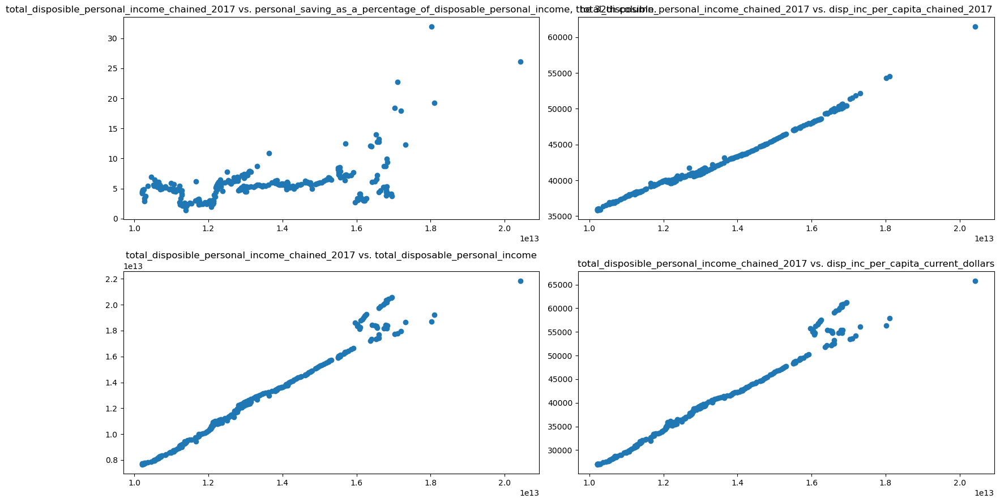

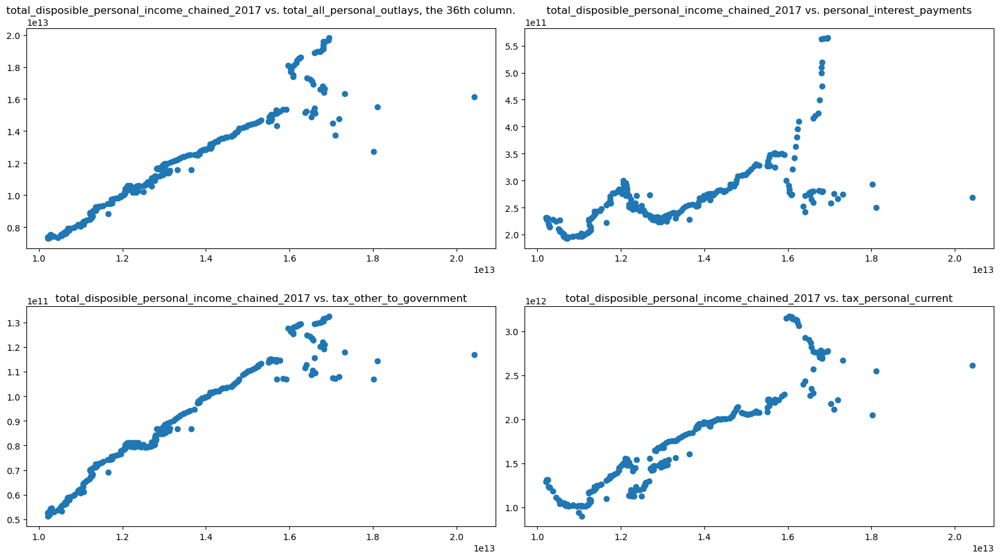

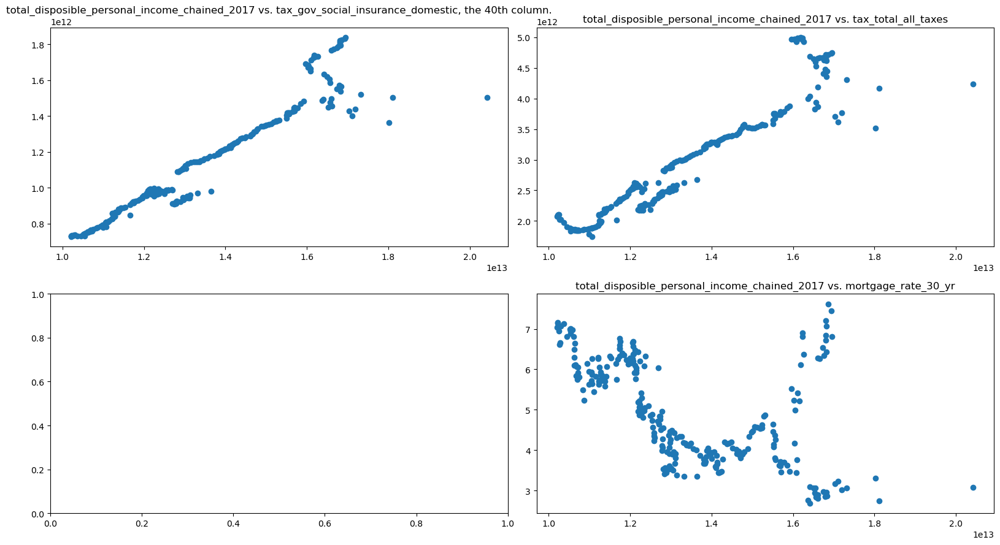

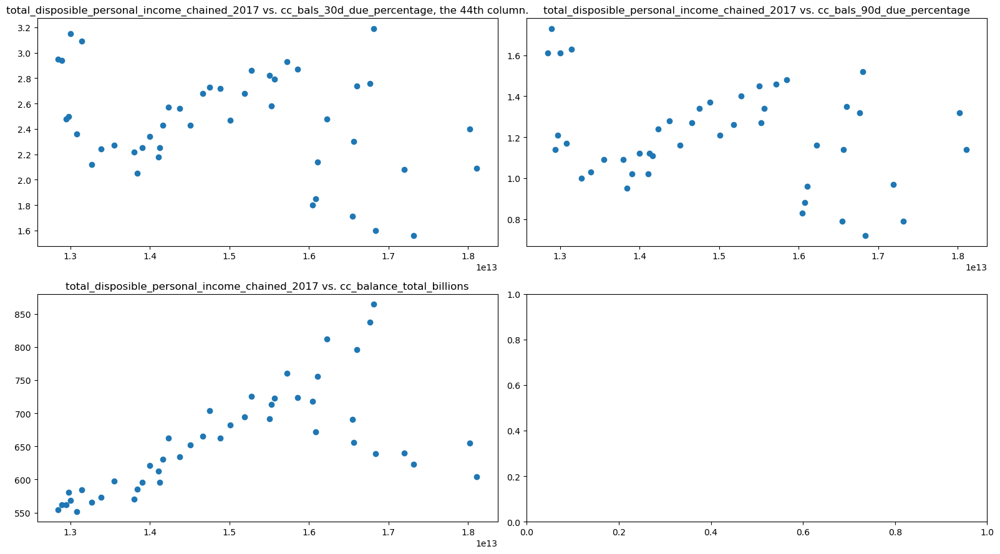

In [10]:
scatter_looker(df, 30)

In [37]:
corr_looker(df, 31, highs=.51)

-0.5564834521361445 is total_personal_savings's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
shelter_yoy                   -0.070562
food_yoy                       0.034109
all_less_food_&_shelter_yoy   -0.017751
cc_bals_90d_due_percentage    -0.071995
cc_balance_total_billions     -0.001316
Name: total_personal_savings, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.546894
population                                                         0.539831
total_personal_income                                              0.575305
employer_contributions_for_employee_pension_and_insurance_funds    0.521373
rental_income_(capital_consumption_adjusted)                       0.530607
total_gov_social_benefits                                          0.790861
social_security                                                    0.521484
medicare                      

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


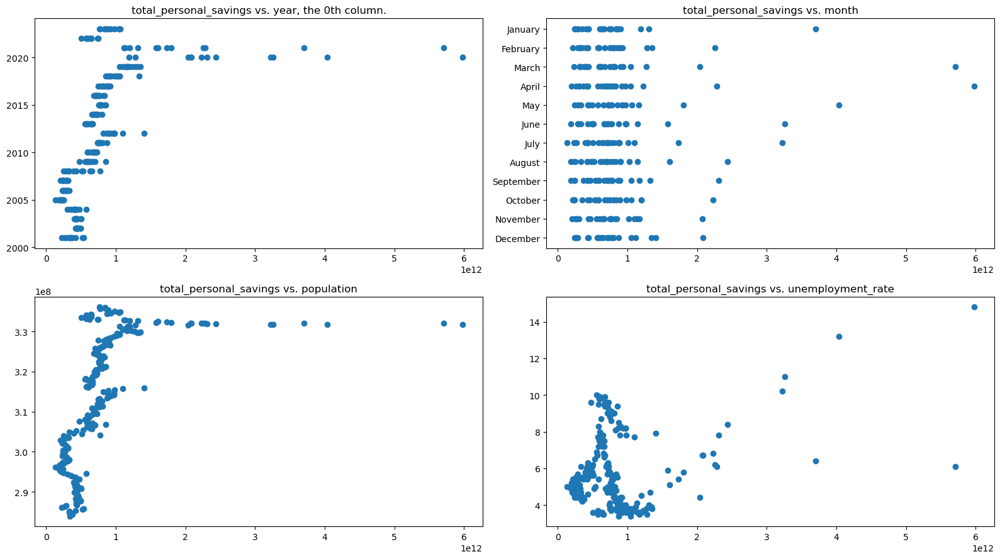

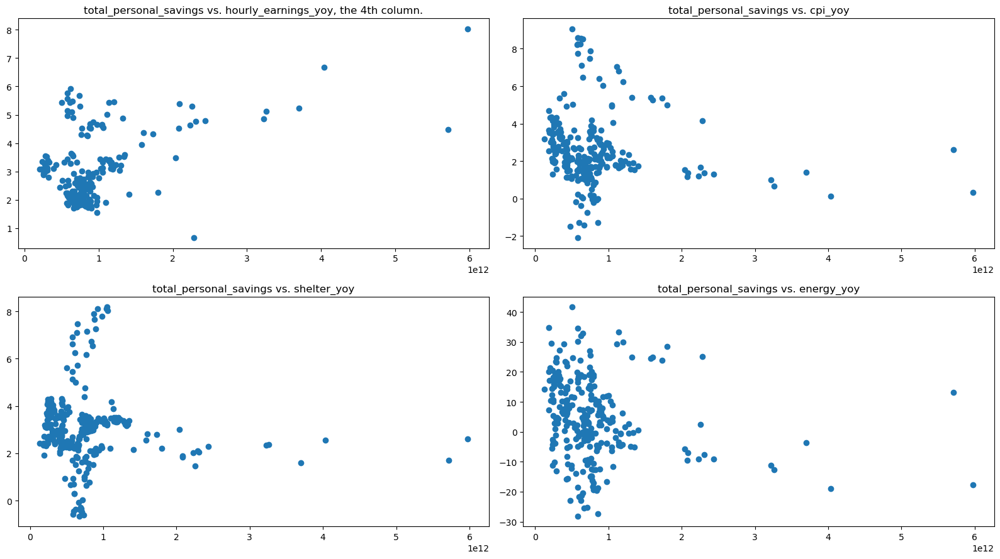

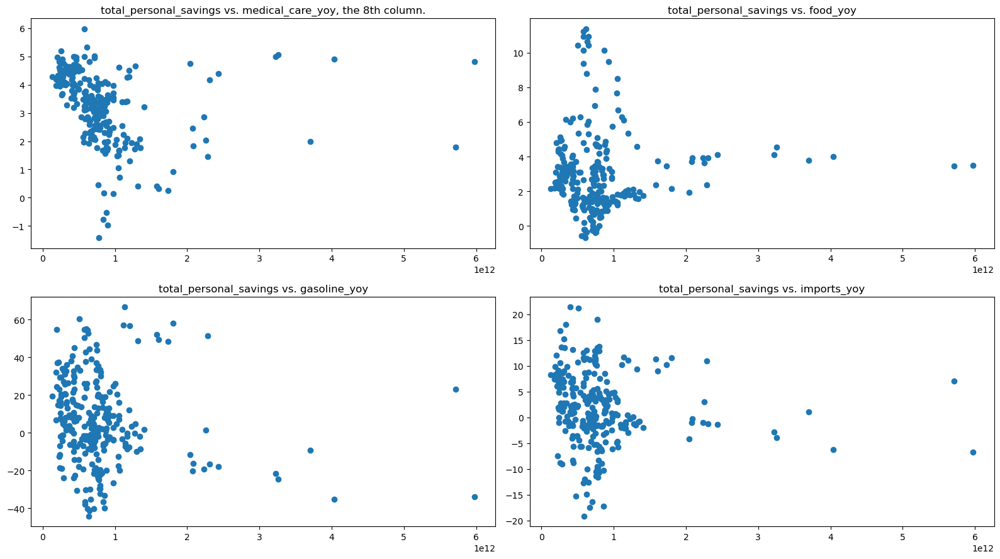

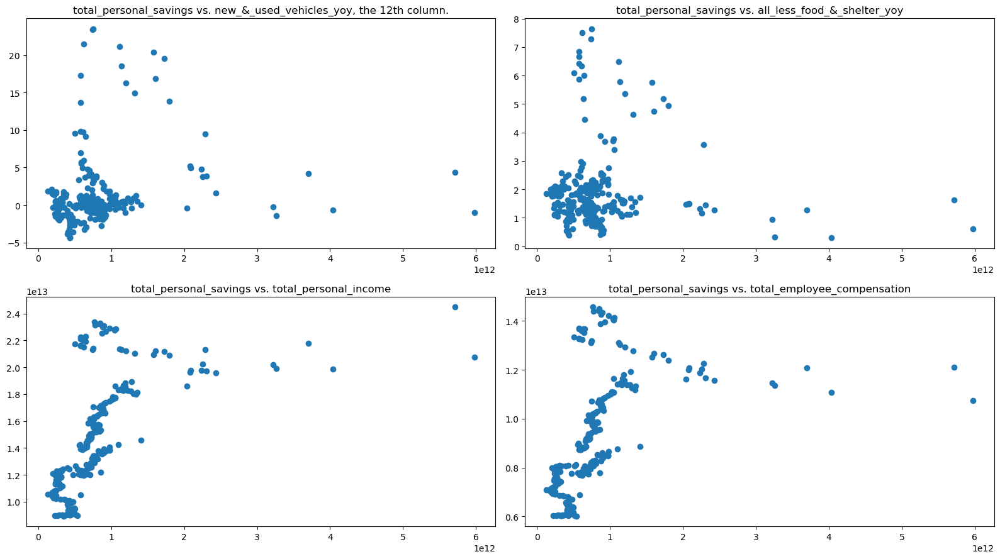

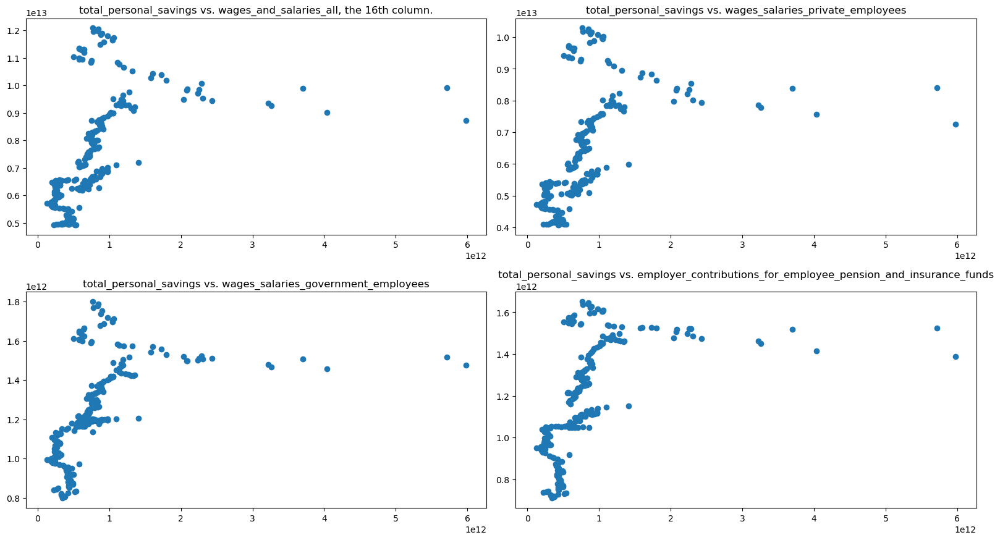

...

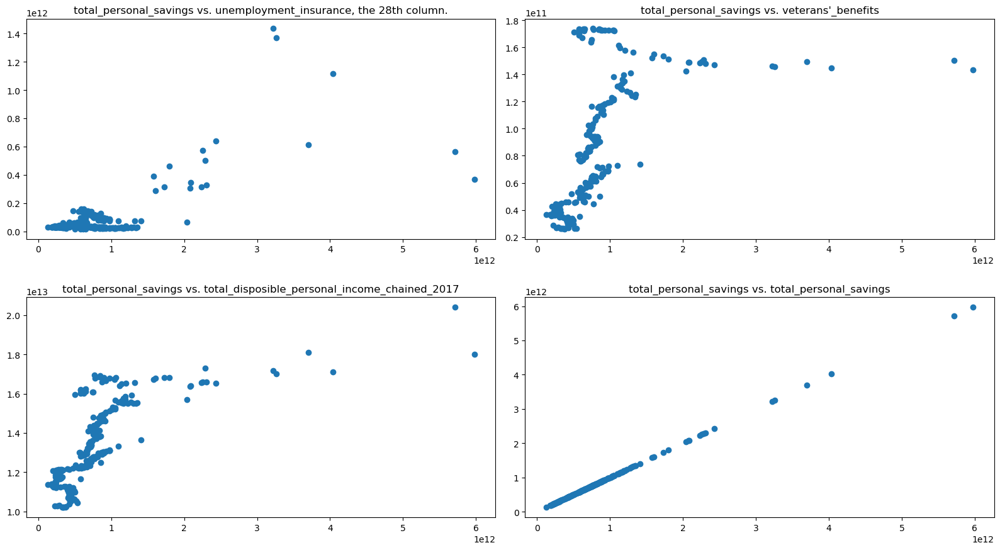

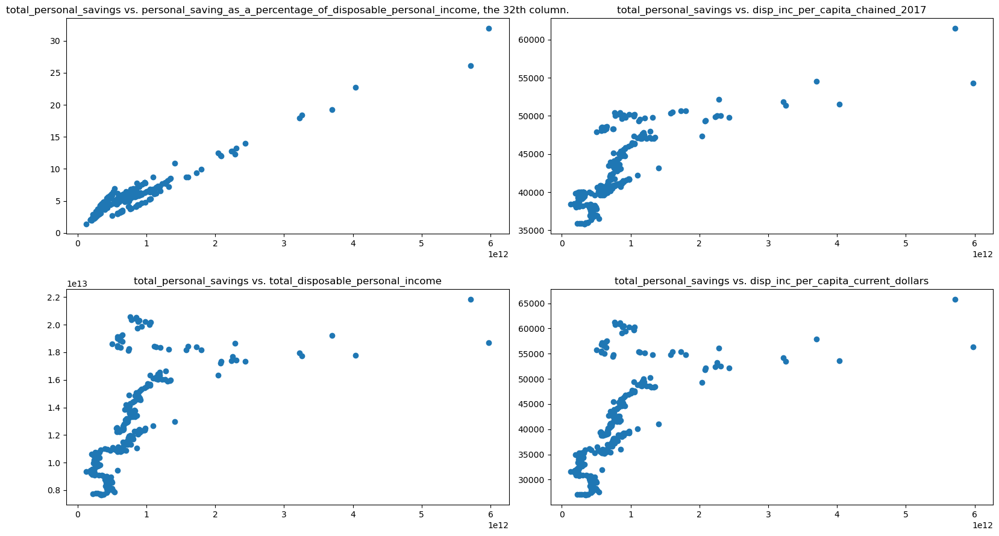

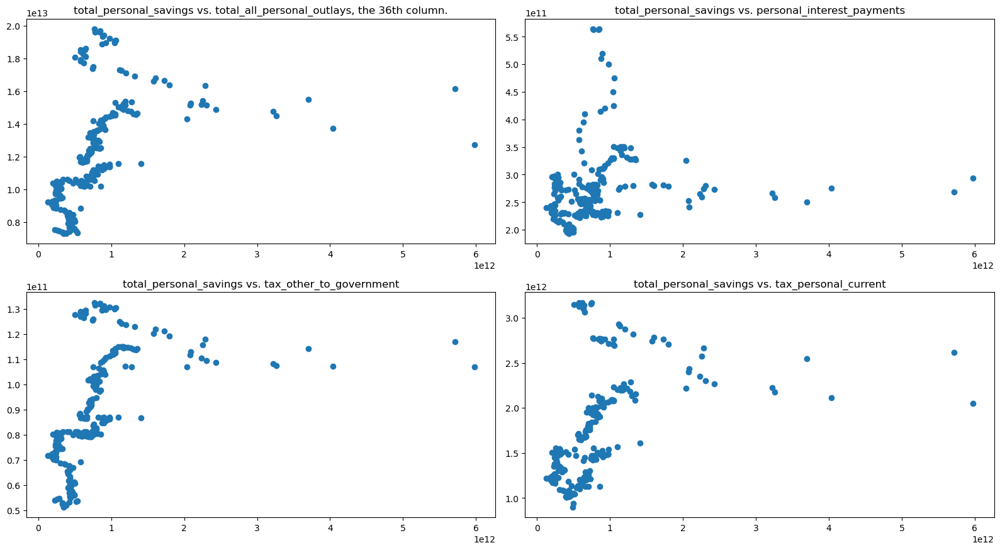

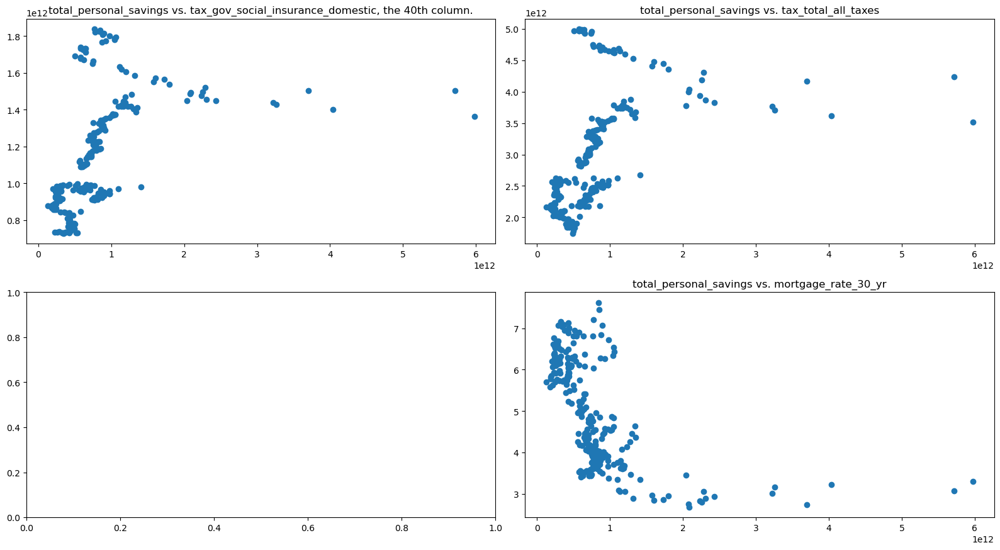

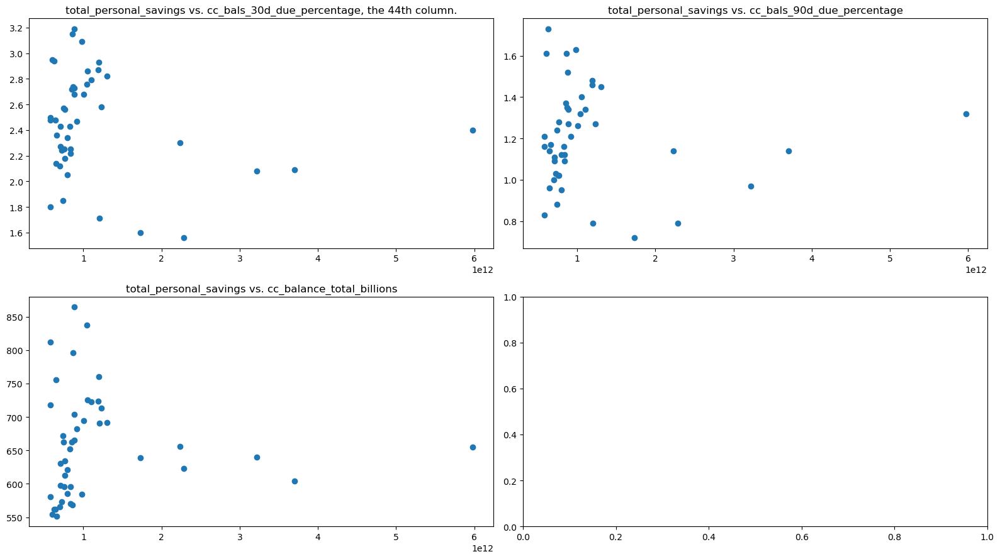

In [11]:
scatter_looker(df, 31)

In [38]:
corr_looker(df, 32, highs=.51)

-0.5521552901766347 is personal_saving_as_a_percentage_of_disposable_personal_income's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
food_yoy                     -0.080270
new_&_used_vehicles_yoy       0.083315
personal_interest_payments   -0.022406
cc_bals_90d_due_percentage   -0.028736
Name: personal_saving_as_a_percentage_of_disposable_personal_income, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
total_gov_social_benefits                                        0.627349
unemployment_insurance                                           0.721666
total_personal_savings                                           0.961533
personal_saving_as_a_percentage_of_disposable_personal_income    1.000000
disp_inc_per_capita_chained_2017                                 0.545301
Name: personal_saving_as_a_percentage_of_disposable_personal_income, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
mortgage_rate_30_yr   -0.552

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


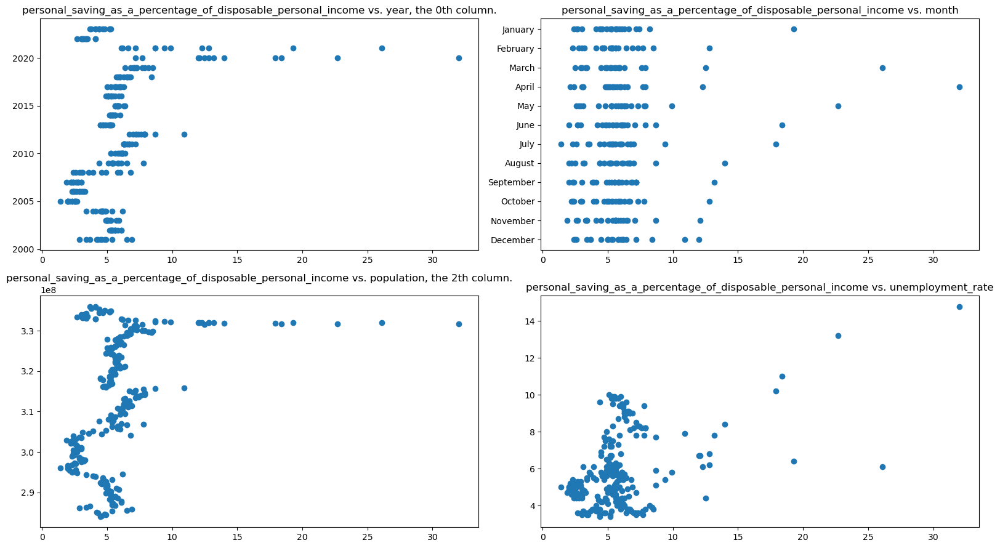

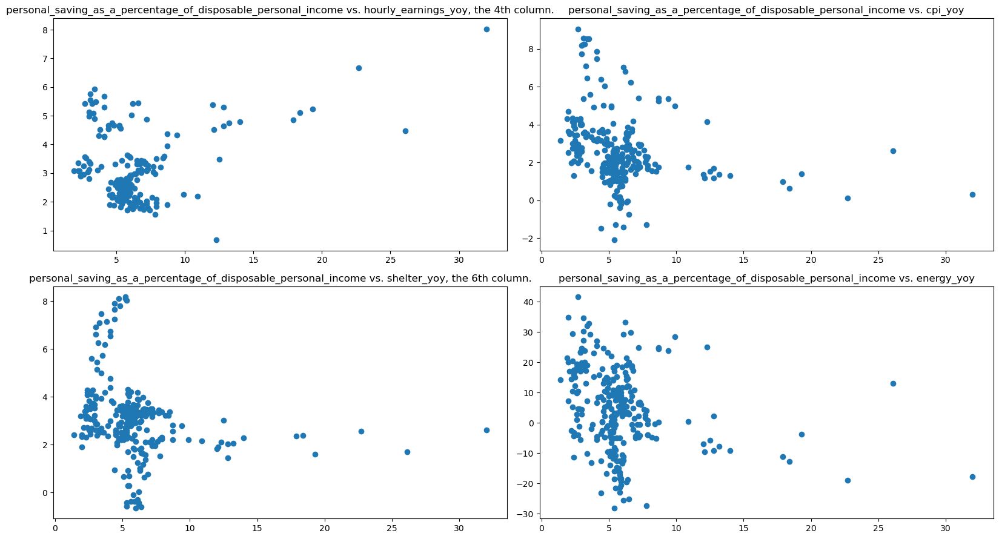

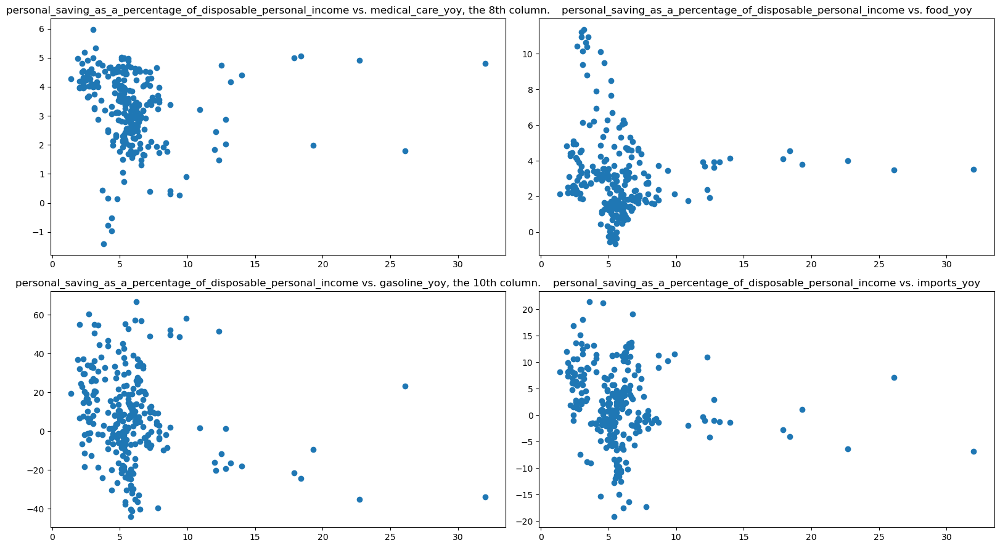

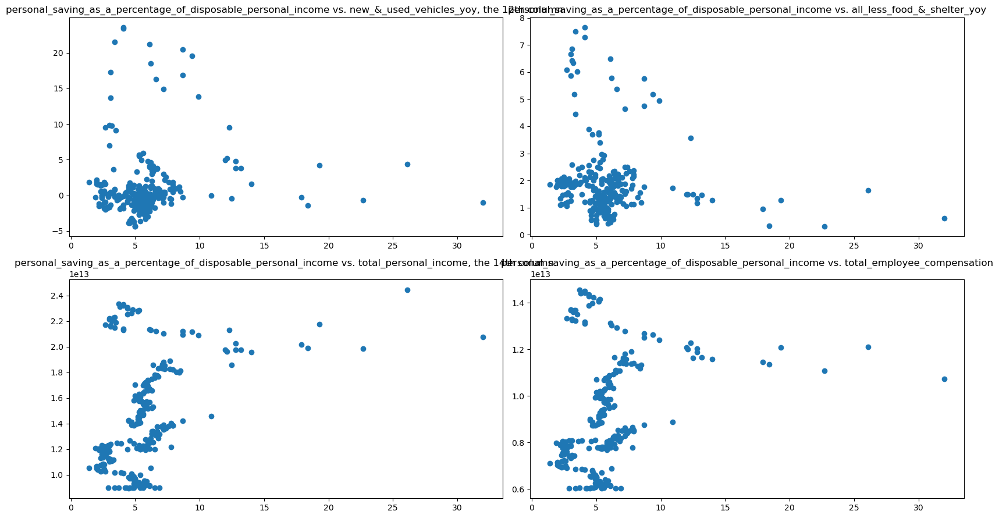

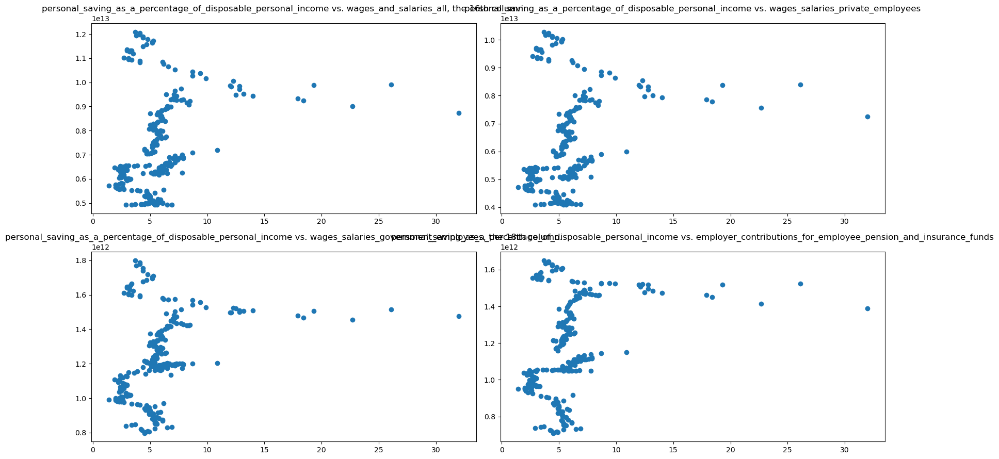

...

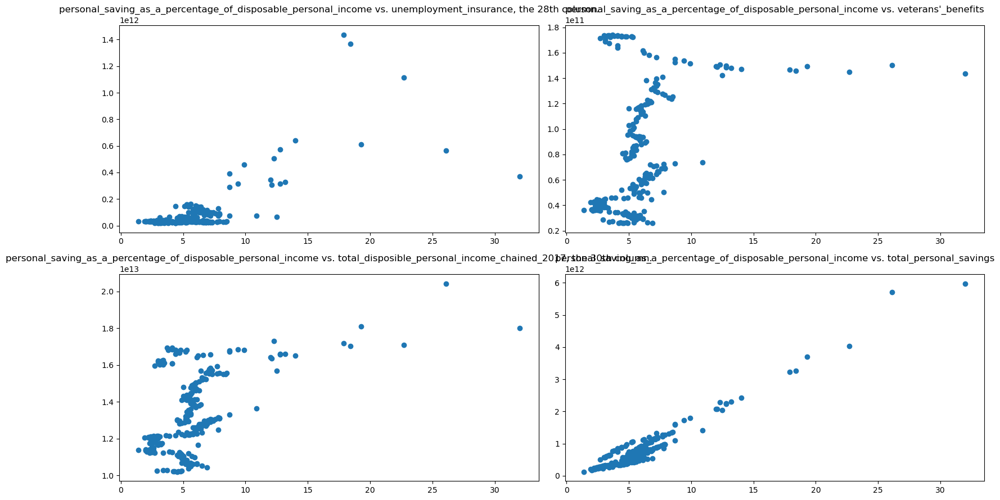

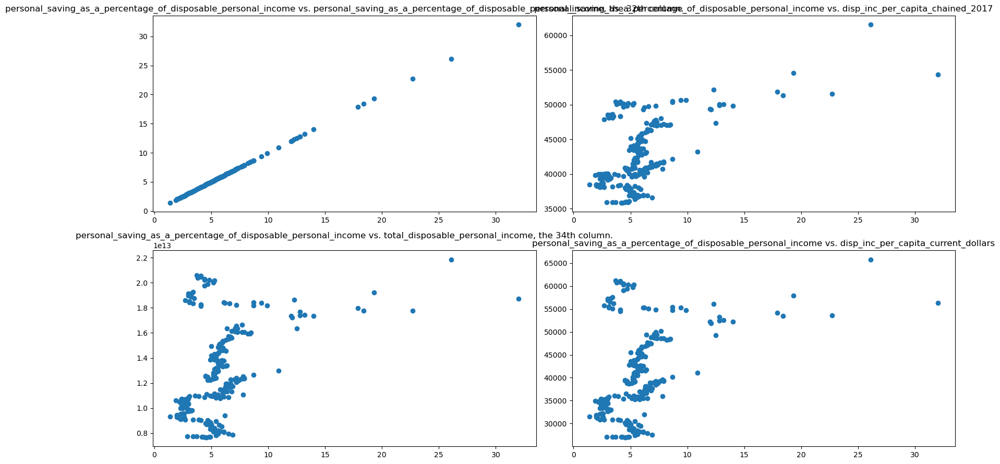

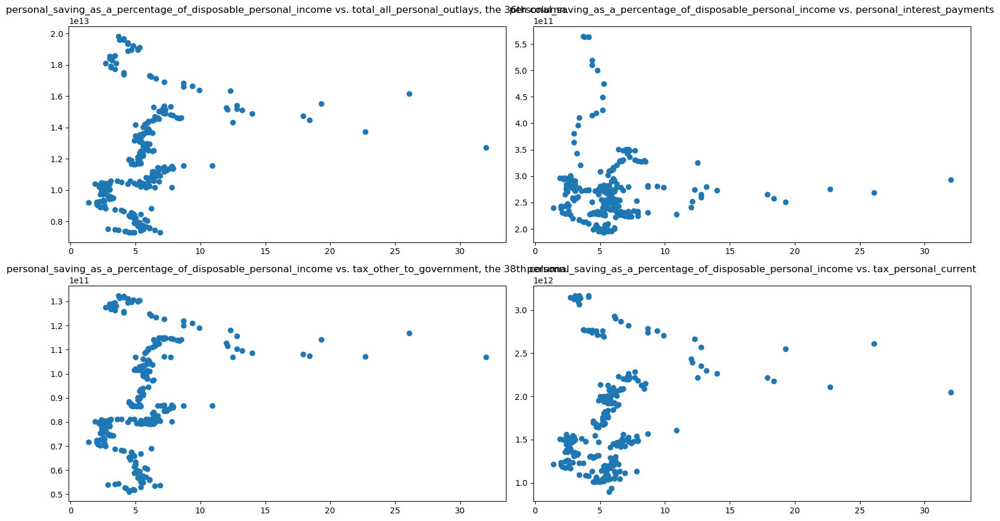

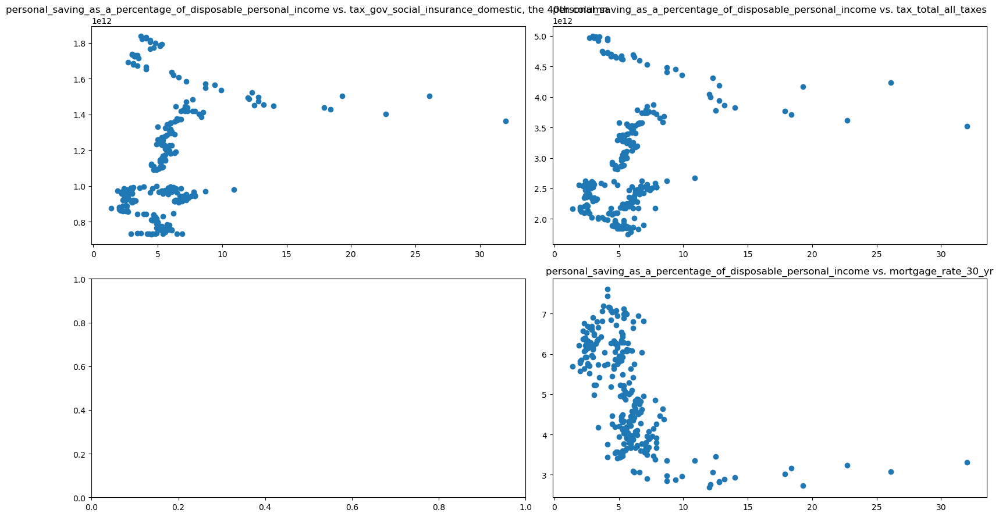

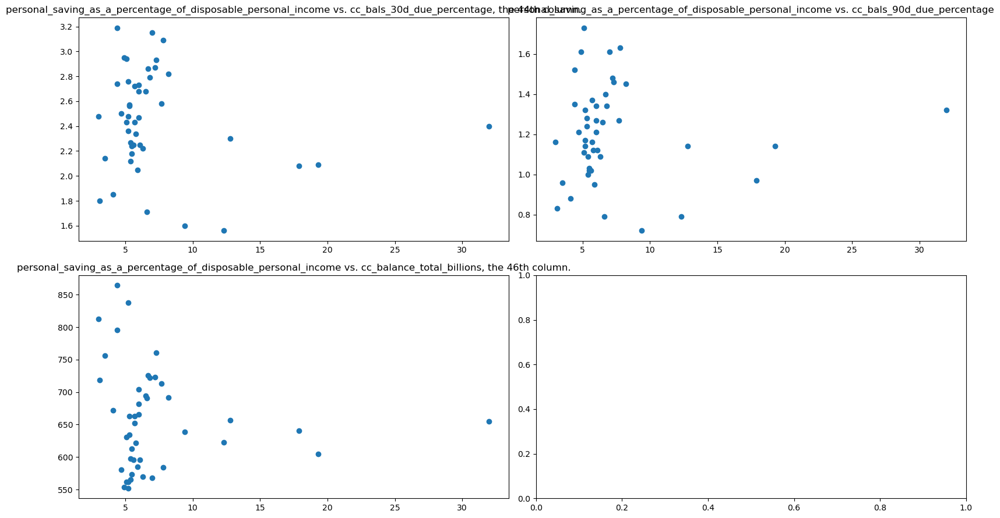

In [39]:
scatter_looker(df, 32)

In [40]:
corr_looker(df, 33, highs=.51)

-0.5487965072683435 is disp_inc_per_capita_chained_2017's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.025914
gasoline_yoy    0.000921
imports_yoy    -0.013426
Name: disp_inc_per_capita_chained_2017, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.939644
population                                                         0.915375
hourly_earnings_yoy                                                0.725772
total_personal_income                                              0.971906
total_employee_compensation                                        0.945111
wages_and_salaries_all                                             0.942519
wages_salaries_private_employees                                   0.940142
wages_salaries_government_employees                                0.939003
employer_contributions_for_employee_pension_and_insurance_f

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


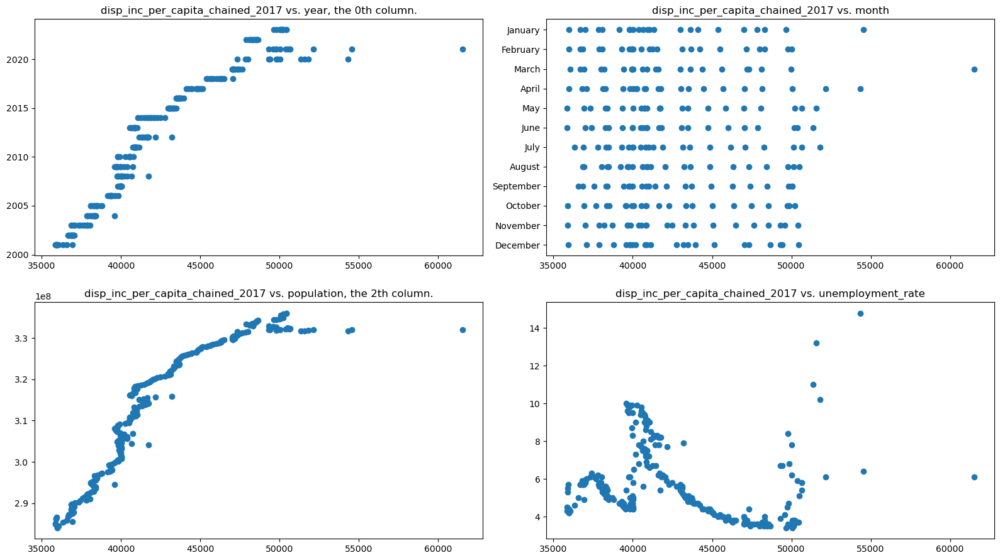

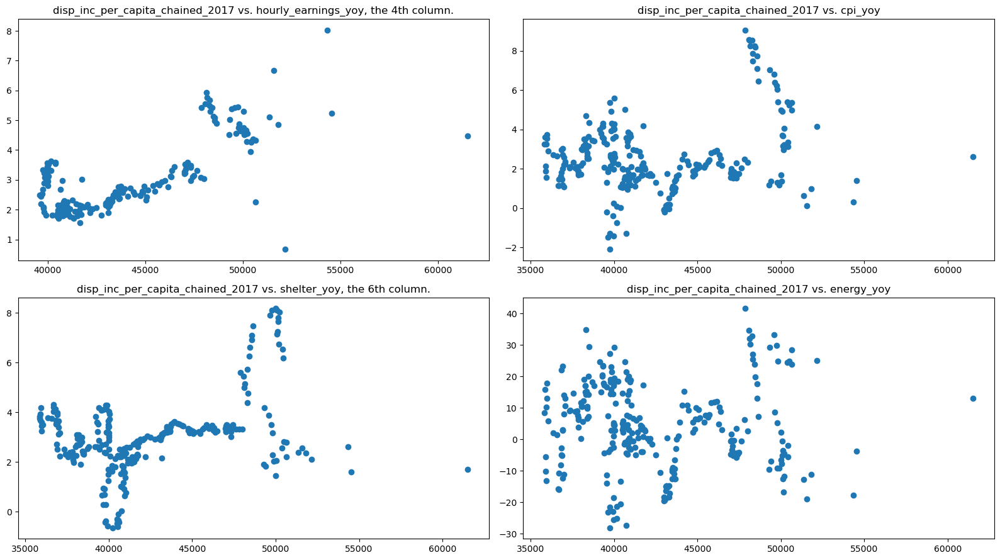

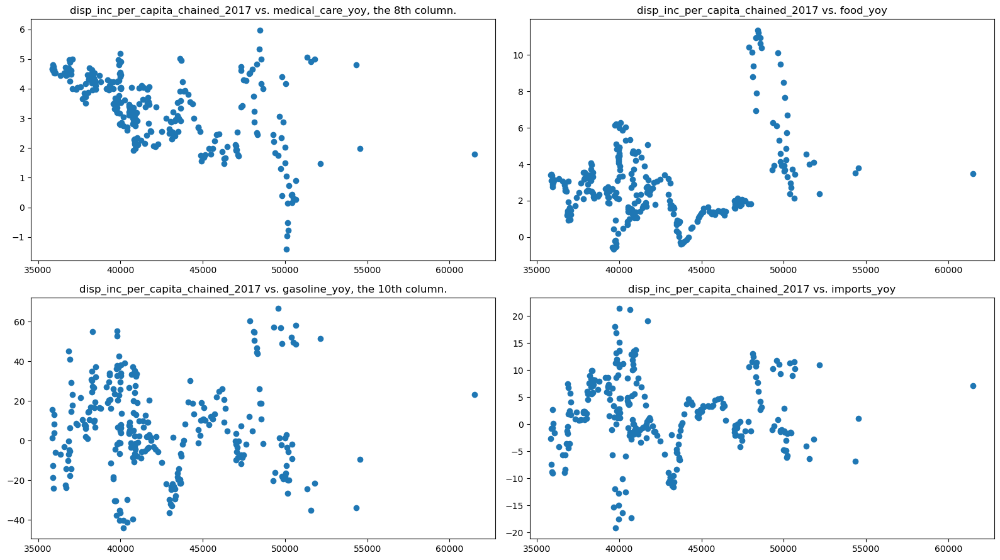

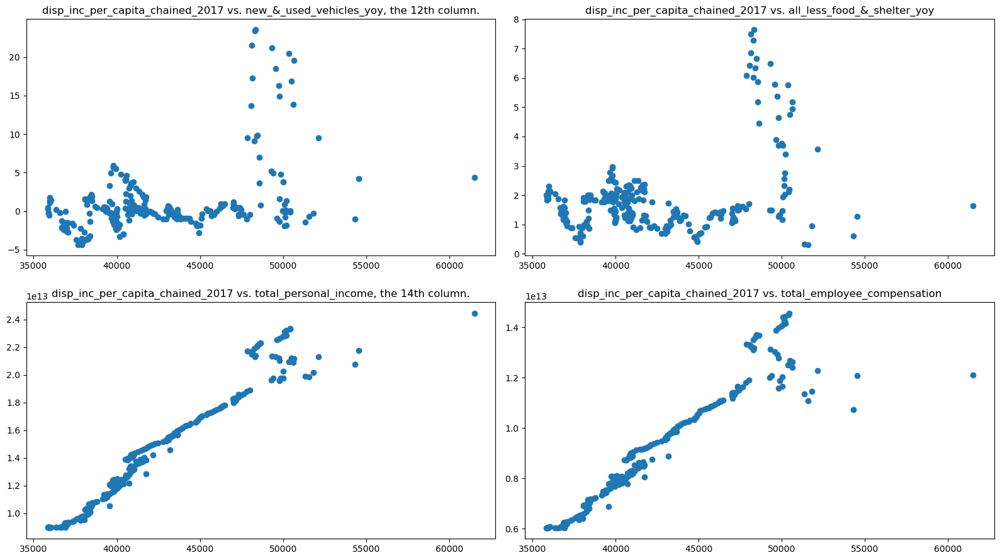

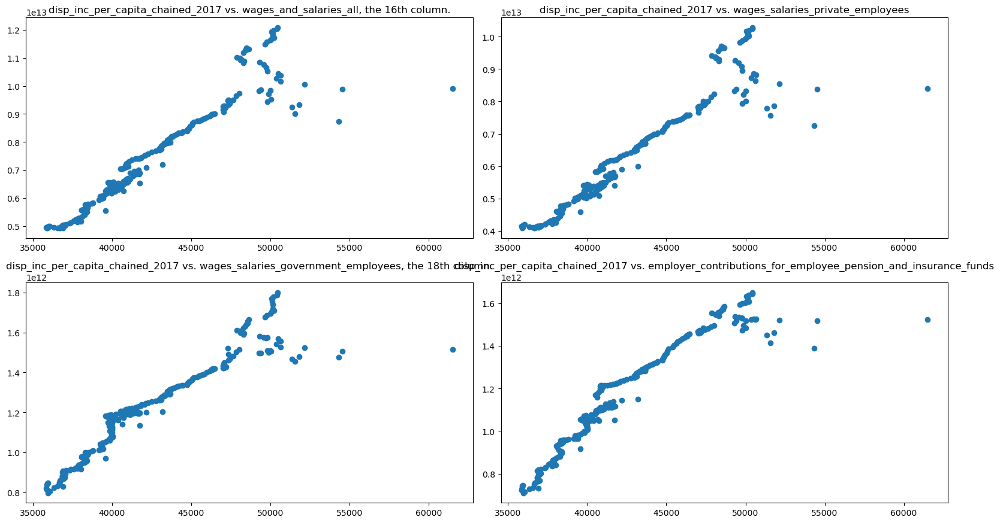

...

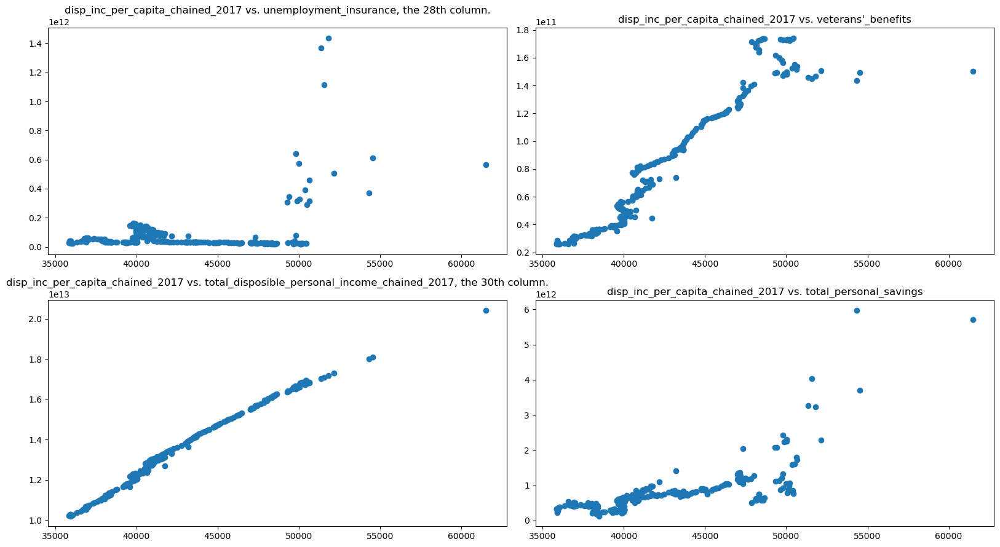

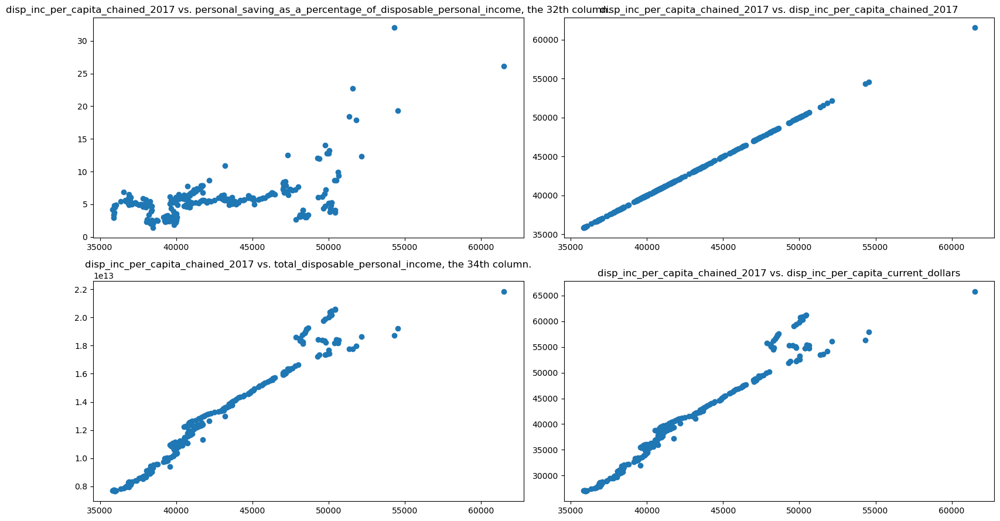

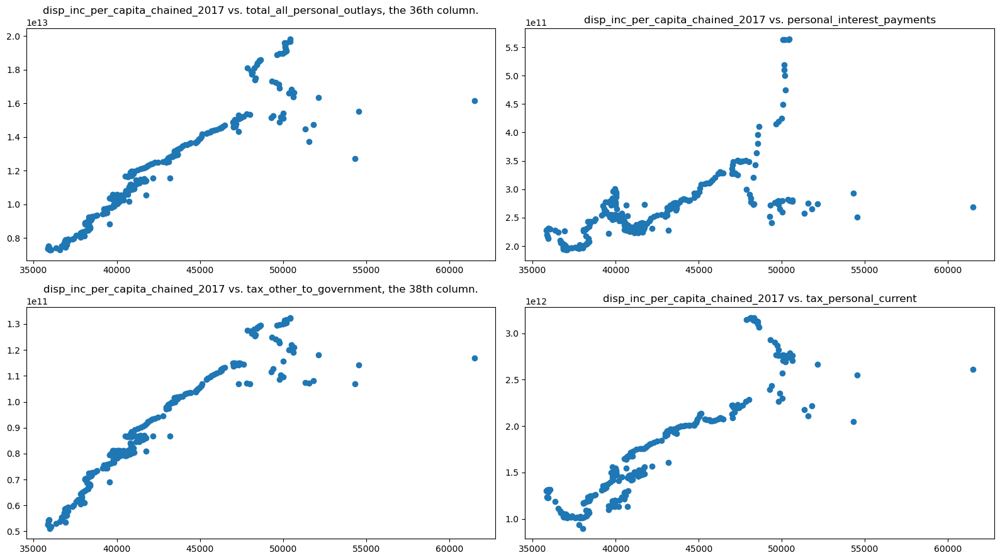

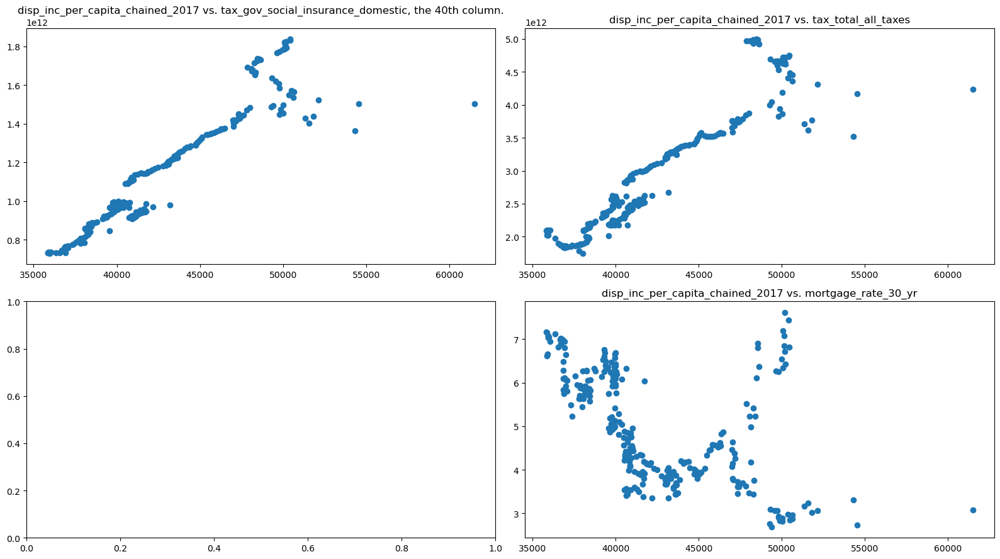

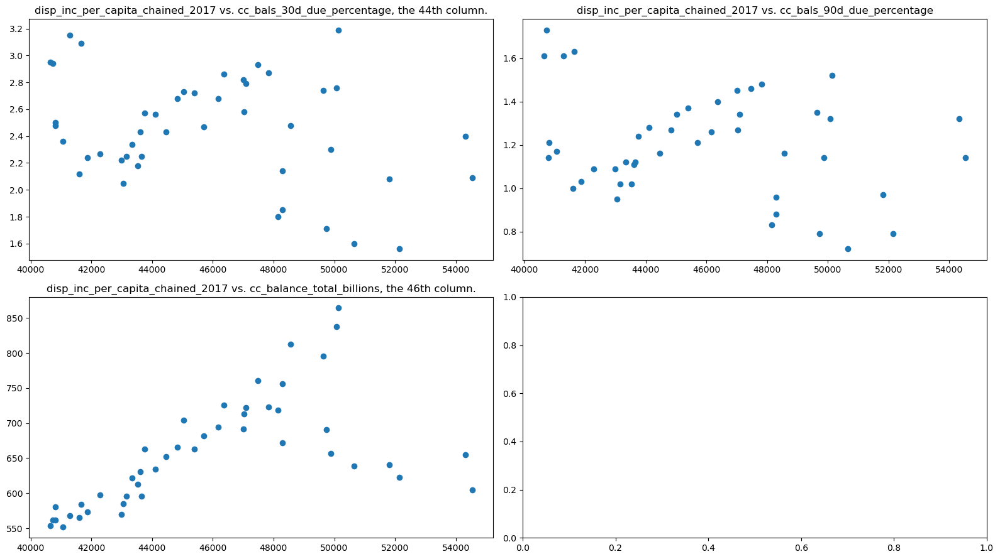

In [43]:
scatter_looker(df, 33)

In [41]:
corr_looker(df, 34, highs=.51)

-0.5970814607932913 is total_disposable_personal_income's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.016830
gasoline_yoy    0.006086
imports_yoy    -0.022544
Name: total_disposable_personal_income, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.977399
population                                                         0.952524
hourly_earnings_yoy                                                0.720625
total_personal_income                                              0.999020
total_employee_compensation                                        0.989429
wages_and_salaries_all                                             0.987601
wages_salaries_private_employees                                   0.984963
wages_salaries_government_employees                                0.984967
employer_contributions_for_employee_pension_and_insurance_f

In [ ]:
scatter_looker(df, 34)

In [44]:
corr_looker(df, 35, highs=.51)

-0.5939455841090571 is disp_inc_per_capita_current_dollars's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.006997
gasoline_yoy    0.014683
imports_yoy    -0.011531
Name: disp_inc_per_capita_current_dollars, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.971188
population                                                         0.944133
hourly_earnings_yoy                                                0.733089
total_personal_income                                              0.998445
total_employee_compensation                                        0.988104
wages_and_salaries_all                                             0.986747
wages_salaries_private_employees                                   0.984220
wages_salaries_government_employees                                0.983338
employer_contributions_for_employee_pension_and_insur

In [ ]:
scatter_looker(df, 35)

In [45]:
corr_looker(df, 36)

-0.6122301258490508 is total_all_personal_outlays's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy      0.022048
gasoline_yoy    0.040810
imports_yoy     0.000970
Name: total_all_personal_outlays, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.969860
population                                                         0.943714
hourly_earnings_yoy                                                0.675786
total_personal_income                                              0.987834
total_employee_compensation                                        0.996913
wages_and_salaries_all                                             0.996133
wages_salaries_private_employees                                   0.994322
wages_salaries_government_employees                                0.987411
employer_contributions_for_employee_pension_and_insurance_funds    0.97

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


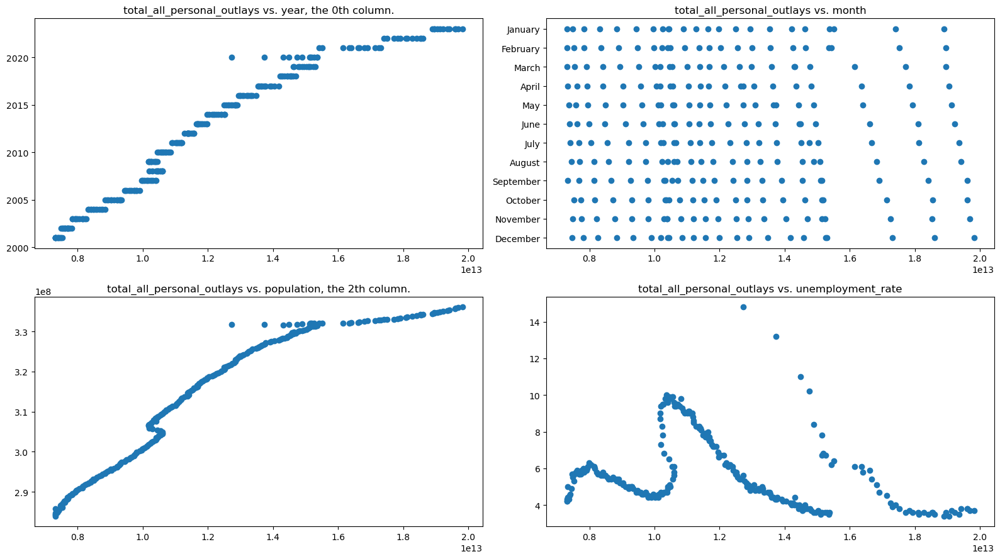

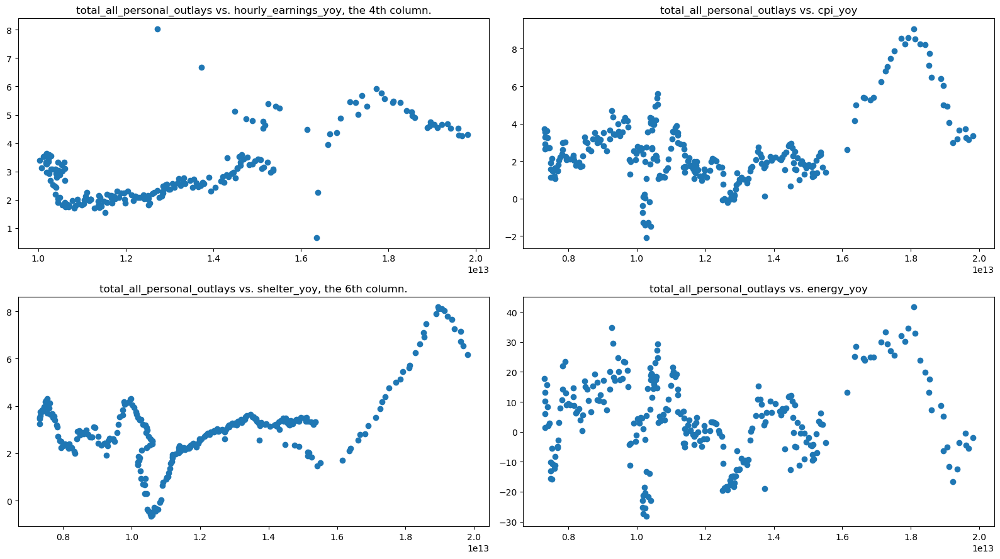

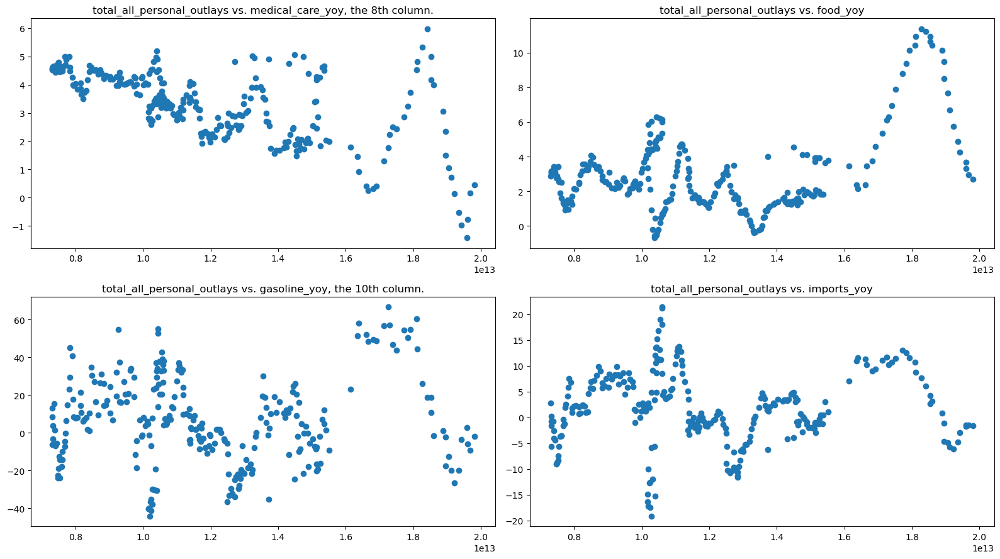

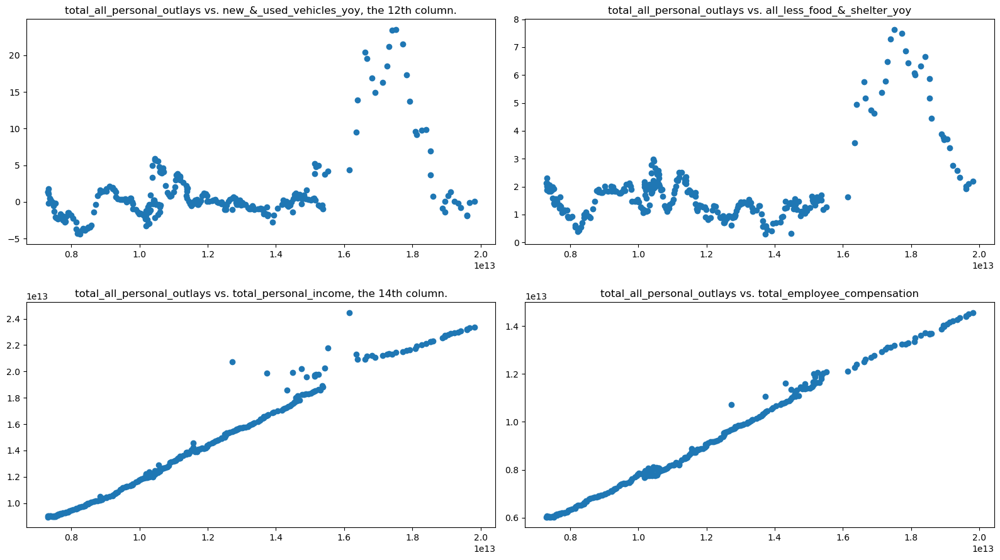

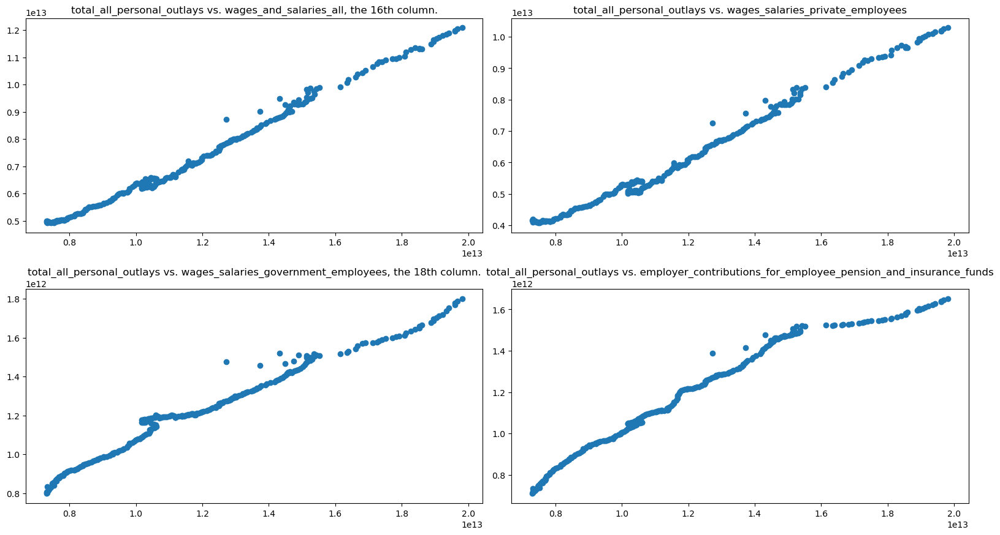

...

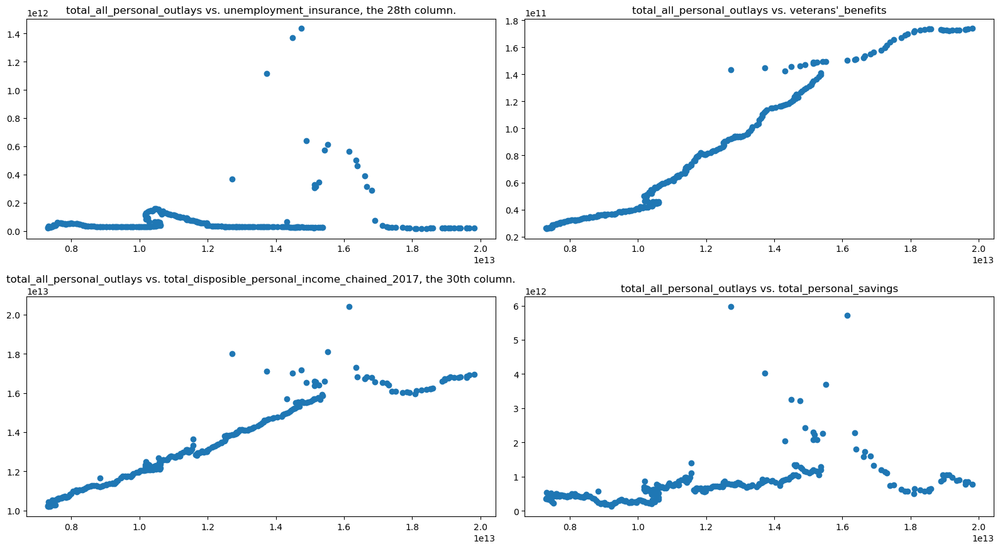

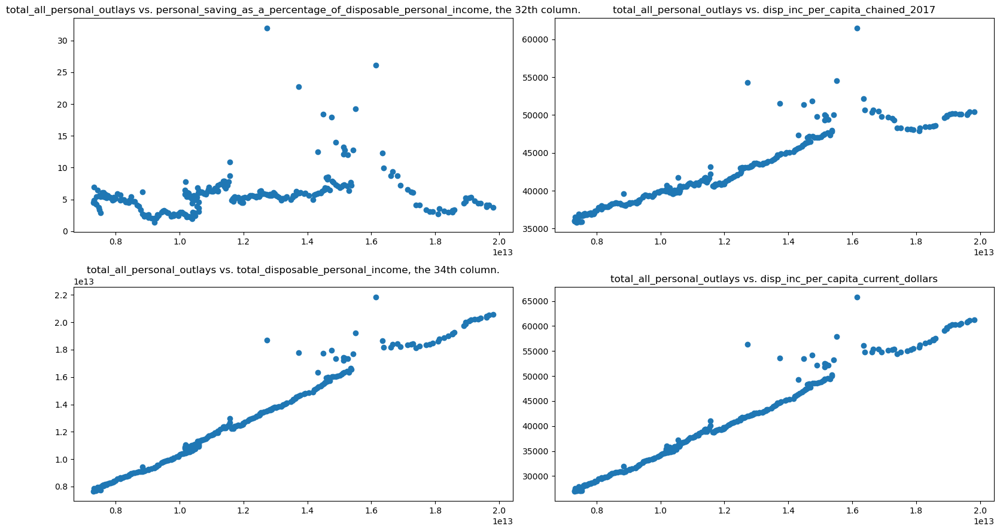

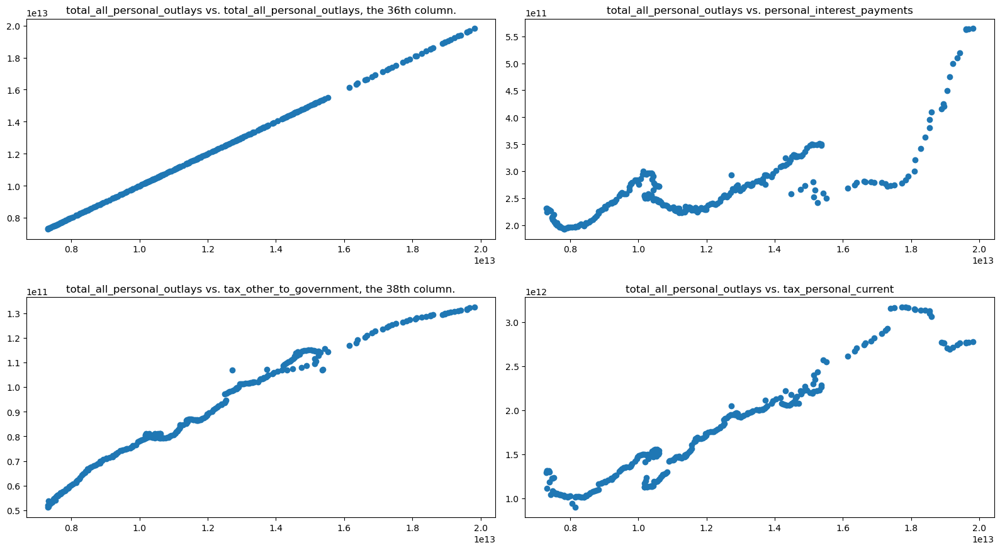

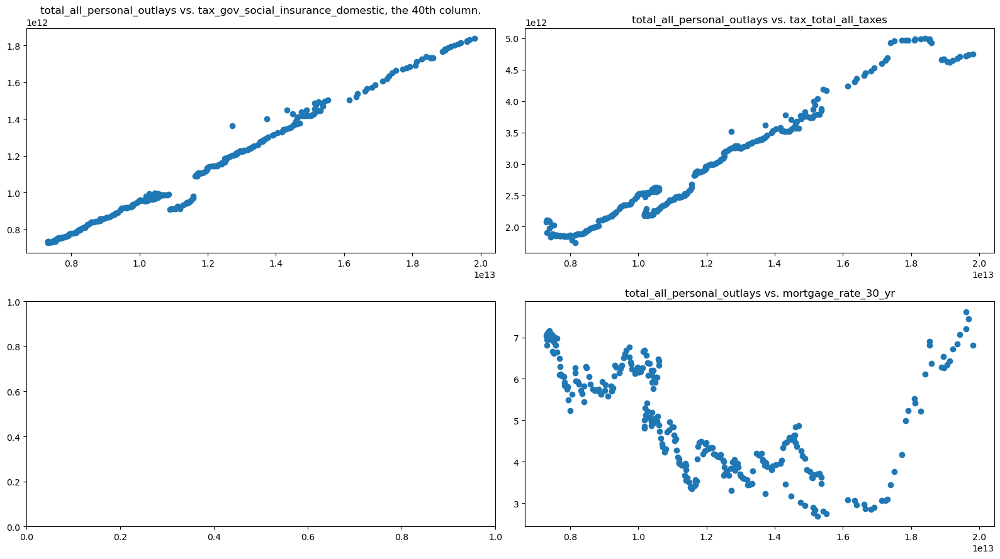

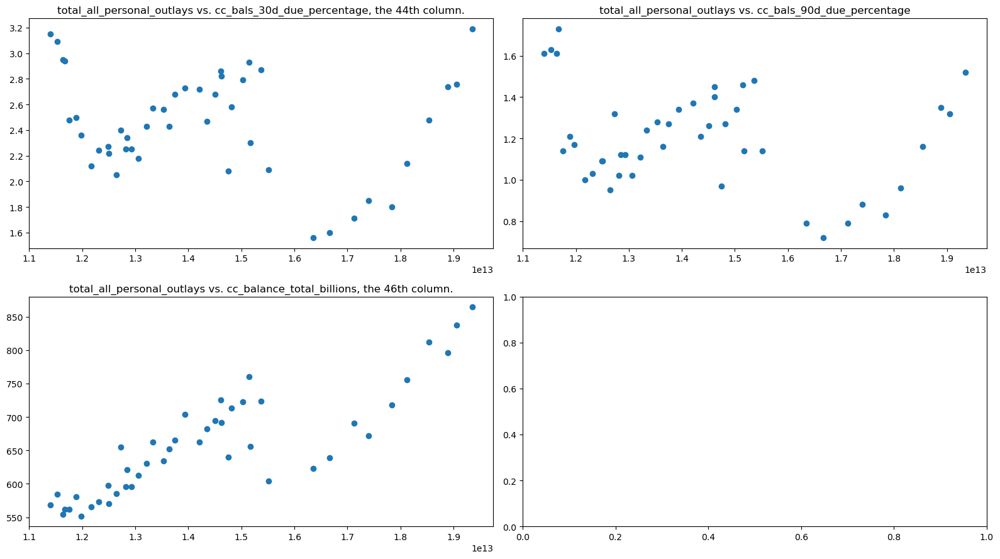

In [46]:
scatter_looker(df, 36)

In [47]:
corr_looker(df, 37, highs=.51)

-0.5170718270378796 is personal_interest_payments's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy                                                      -0.084280
gasoline_yoy                                                    -0.091331
imports_yoy                                                     -0.080340
new_&_used_vehicles_yoy                                          0.076588
unemployment_insurance                                          -0.079631
personal_saving_as_a_percentage_of_disposable_personal_income   -0.022406
Name: personal_interest_payments, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.677534
population                                                         0.641804
shelter_yoy                                                        0.664911
total_personal_income                                              0.736206
total_

In [ ]:
scatter_looker(df, 37)

In [48]:
corr_looker(df, 38, highs=.51)

-0.6061063260928302 is tax_other_to_government's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.006030
gasoline_yoy    0.018512
imports_yoy    -0.012883
Name: tax_other_to_government, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.982915
population                                                         0.968624
hourly_earnings_yoy                                                0.681942
total_personal_income                                              0.980702
total_employee_compensation                                        0.986983
wages_and_salaries_all                                             0.983117
wages_salaries_private_employees                                   0.979902
wages_salaries_government_employees                                0.984699
employer_contributions_for_employee_pension_and_insurance_funds    0.992581
e

In [ ]:
scatter_looker(df, 38)

In [49]:
corr_looker(df, 39, highs=.51)

-0.5151267637997826 is tax_personal_current's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy      0.099164
gasoline_yoy    0.093198
imports_yoy     0.042023
Name: tax_personal_current, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.924391
population                                                         0.888588
hourly_earnings_yoy                                                0.721594
shelter_yoy                                                        0.568325
new_&_used_vehicles_yoy                                            0.549768
all_less_food_&_shelter_yoy                                        0.555537
total_personal_income                                              0.963291
total_employee_compensation                                        0.969646
wages_and_salaries_all                                             0.972084
wages_s

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


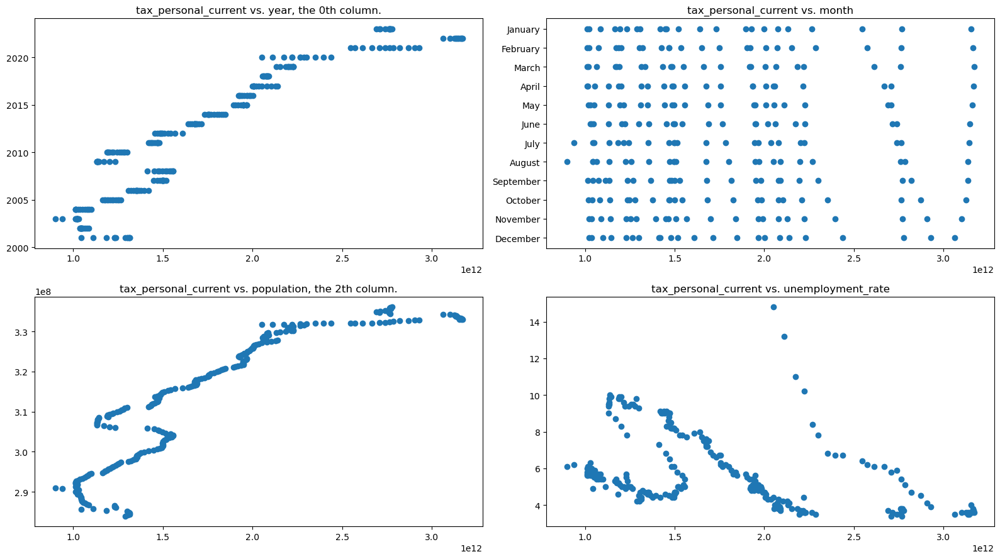

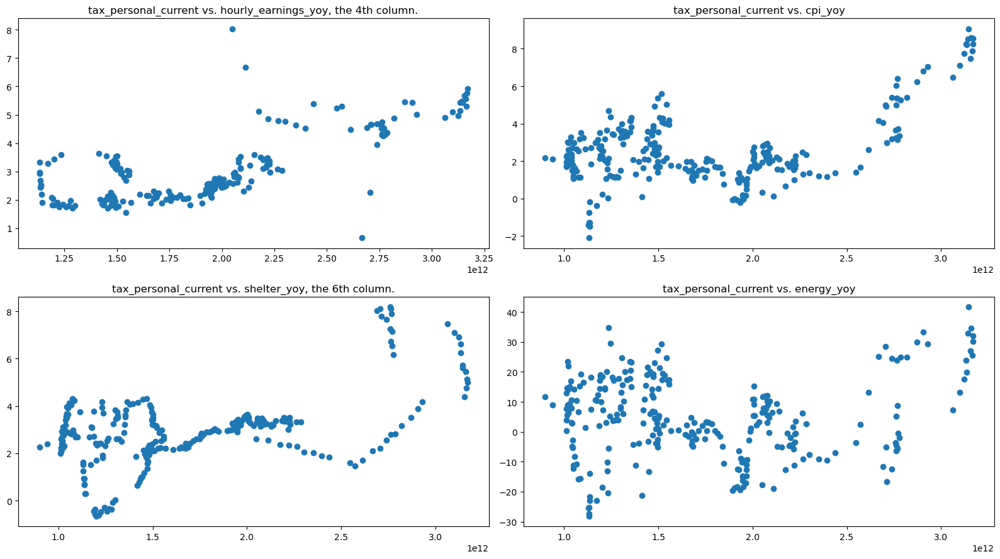

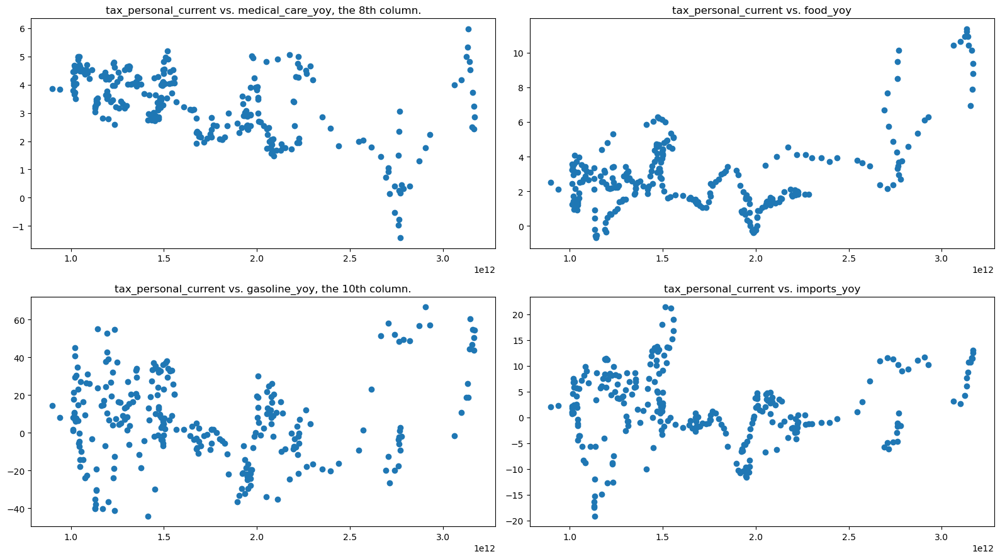

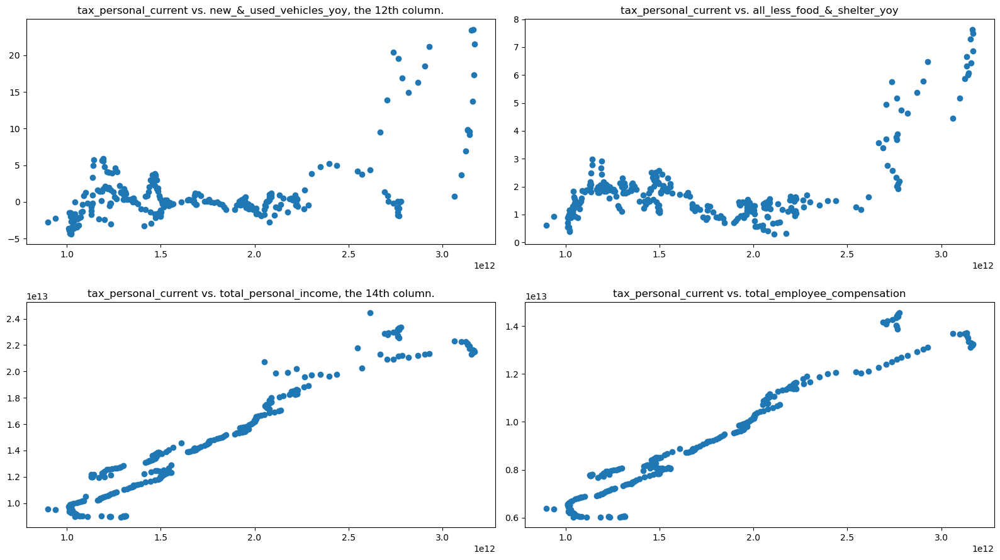

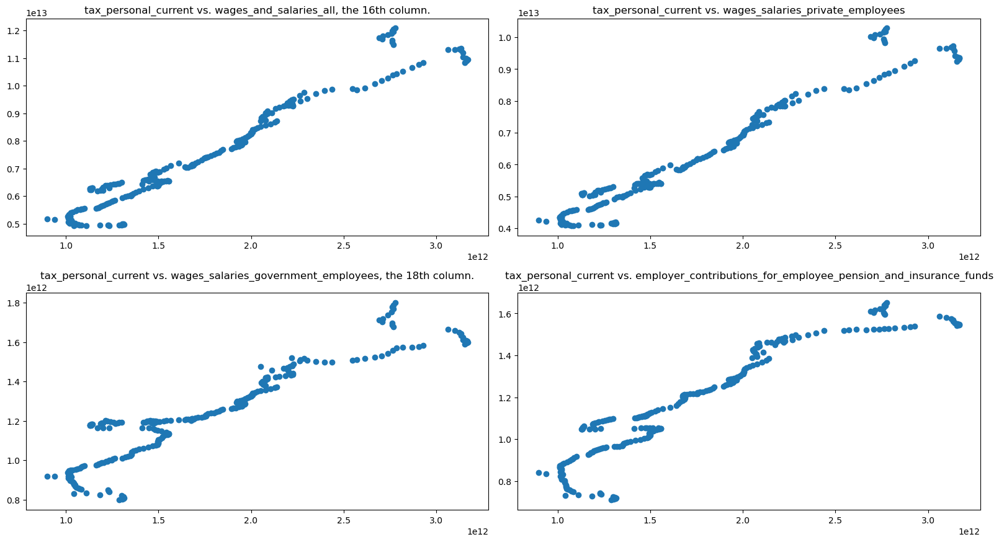

...

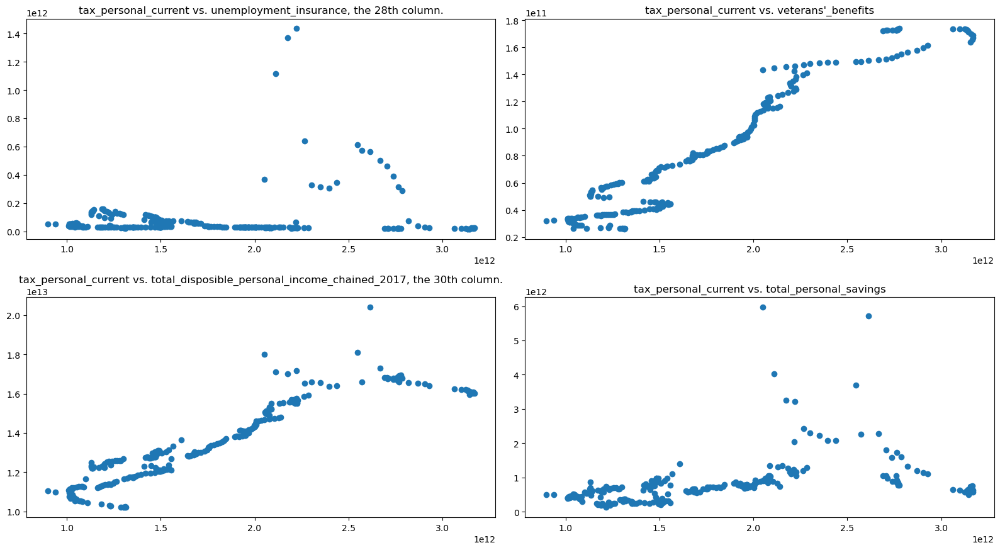

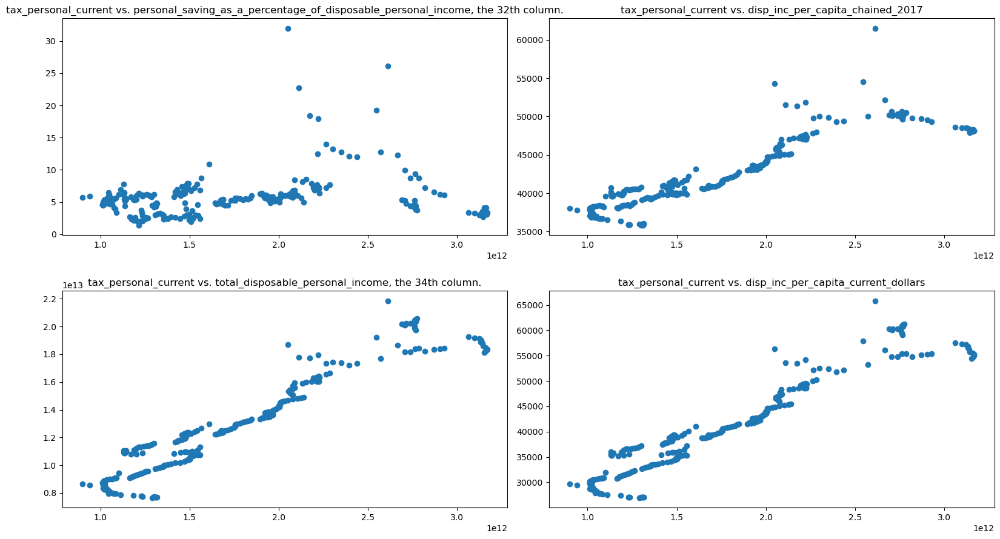

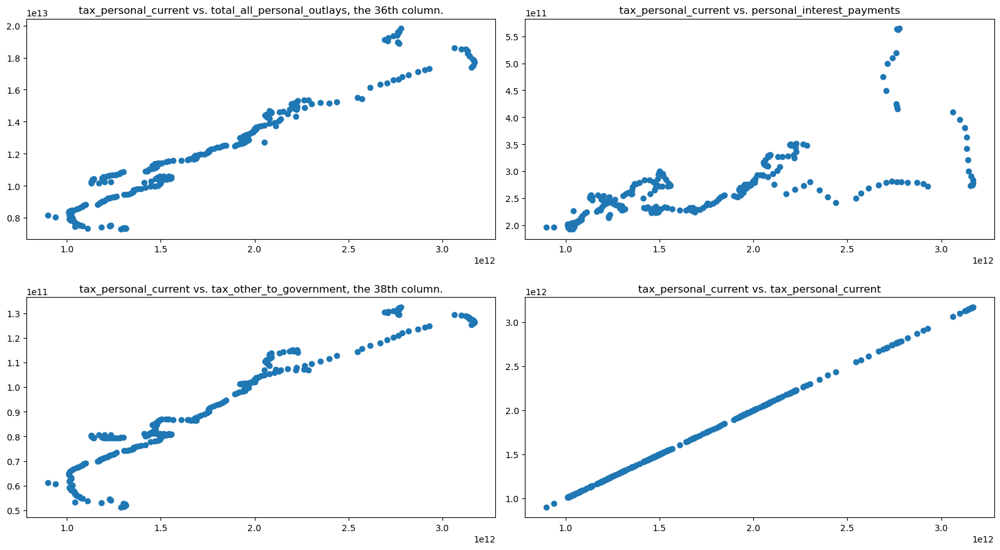

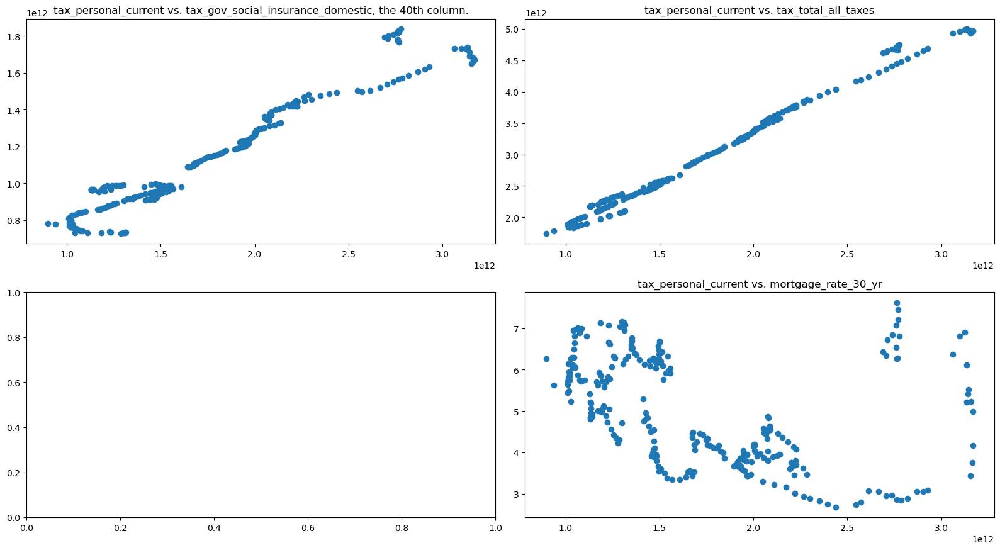

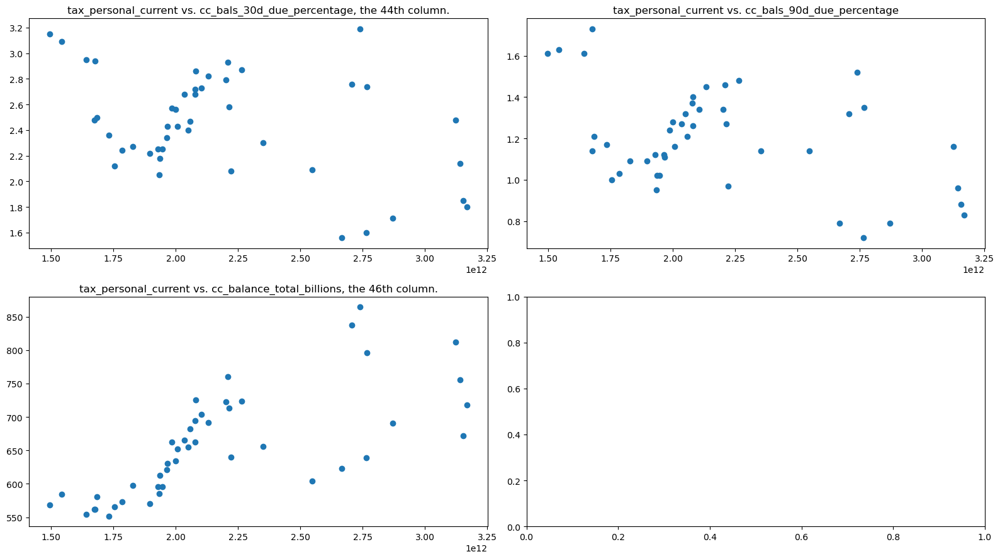

In [50]:
scatter_looker(df, 39)

In [51]:
corr_looker(df, 40)

-0.5859990829855132 is tax_gov_social_insurance_domestic's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy     -0.000199
gasoline_yoy    0.010724
imports_yoy    -0.033263
Name: tax_gov_social_insurance_domestic, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.956963
population                                                         0.925395
hourly_earnings_yoy                                                0.721584
shelter_yoy                                                        0.537516
total_personal_income                                              0.983965
total_employee_compensation                                        0.994654
wages_and_salaries_all                                             0.994931
wages_salaries_private_employees                                   0.994896
wages_salaries_government_employees                      

In [ ]:
scatter_looker(df, 40)

In [52]:
corr_looker(df, 41)

-0.5451843717839329 is tax_total_all_taxes's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
energy_yoy      0.064286
gasoline_yoy    0.064644
imports_yoy     0.015926
Name: tax_total_all_taxes, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.944237
population                                                         0.910074
hourly_earnings_yoy                                                0.727904
shelter_yoy                                                        0.559729
new_&_used_vehicles_yoy                                            0.516344
all_less_food_&_shelter_yoy                                        0.523880
total_personal_income                                              0.978492
total_employee_compensation                                        0.986343
wages_and_salaries_all                                             0.987927
wages_sal

In [59]:
print(df.columns[42])
# corr_looker(df, 42) #error with this one... recall what happened earlier...

cc_rate_all_ns


In [55]:
corr_looker(df, 43)

-0.6475577221787518 is mortgage_rate_30_yr's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
gasoline_yoy                   0.068064
imports_yoy                    0.094978
all_less_food_&_shelter_yoy    0.027596
Name: mortgage_rate_30_yr, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
mortgage_rate_30_yr          1.000000
cc_balance_total_billions    0.665708
Name: mortgage_rate_30_yr, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                              -0.647558
population                                                        -0.640766
employer_contributions_for_employee_pension_and_insurance_funds   -0.541149
rental_income_(capital_consumption_adjusted)                      -0.555069
total_gov_social_benefits                                         -0.536697
medicare                                                          -0.533714
total_disposible_personal_in

In [63]:
# df.corr(numeric_only=True)['mortgage_rate_30_yr']

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


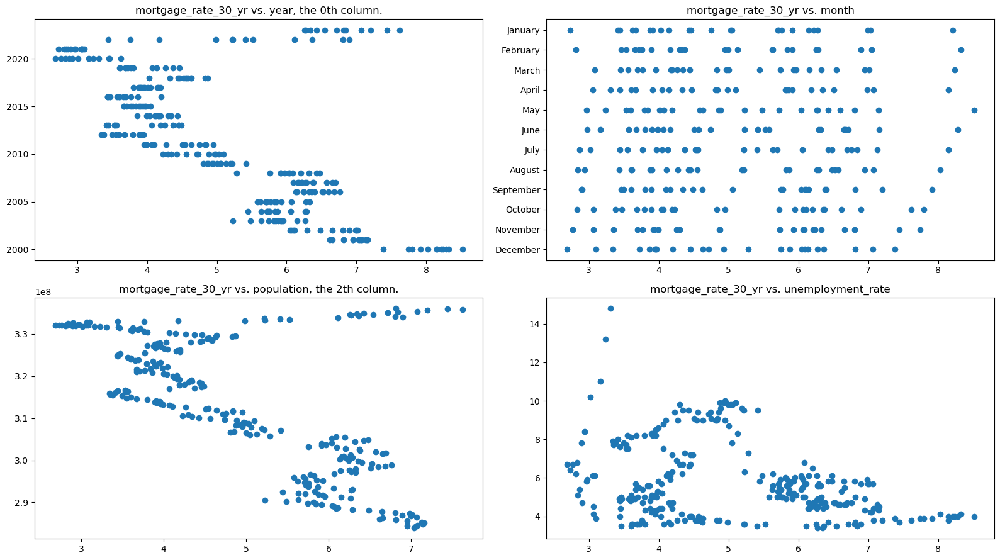

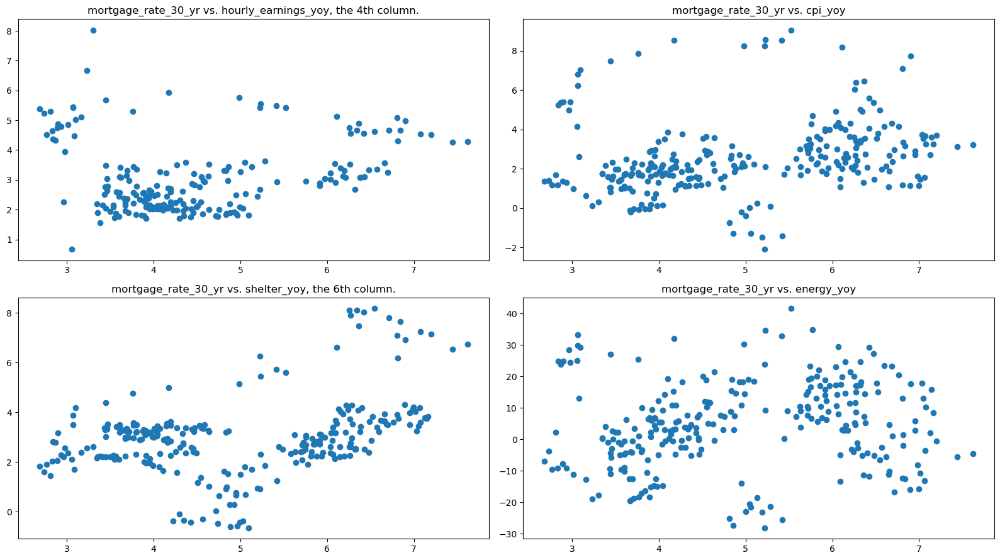

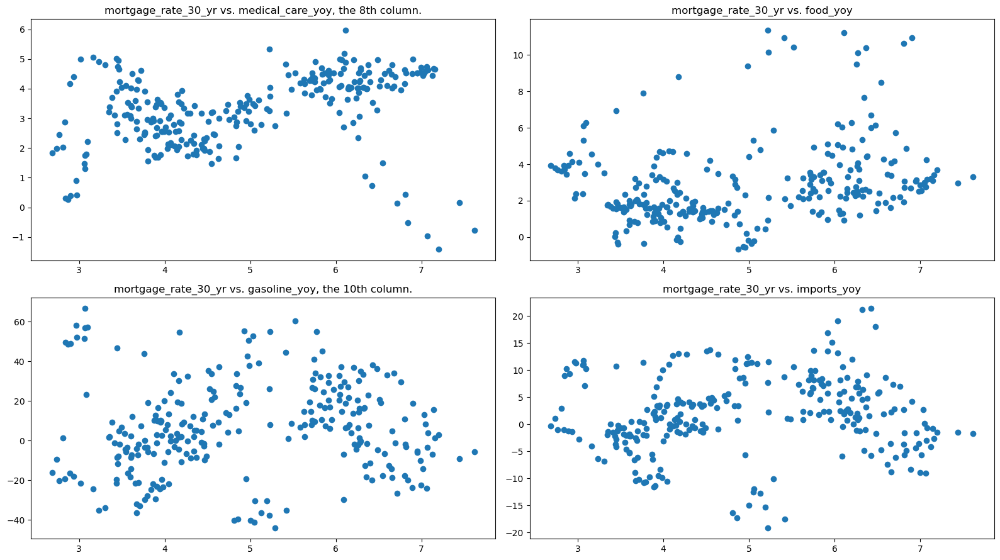

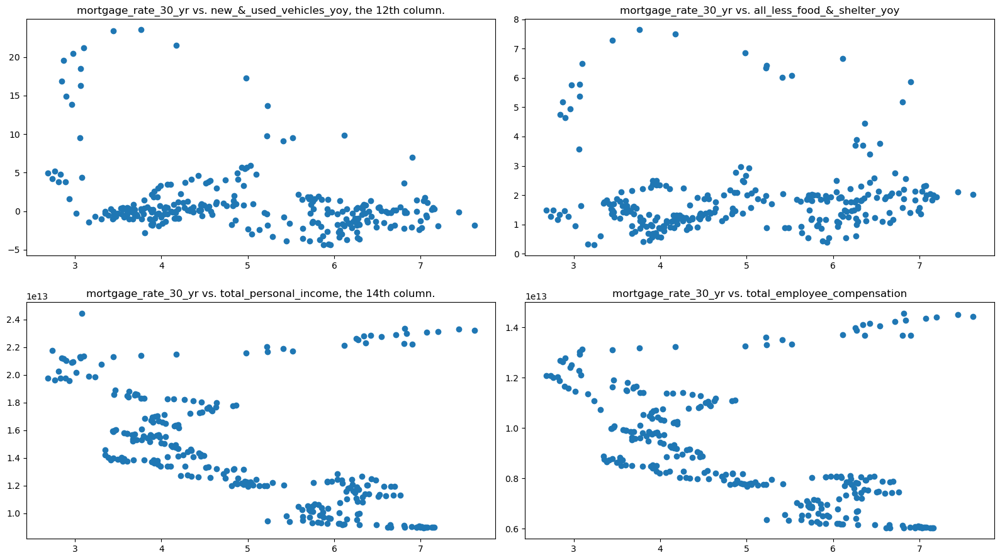

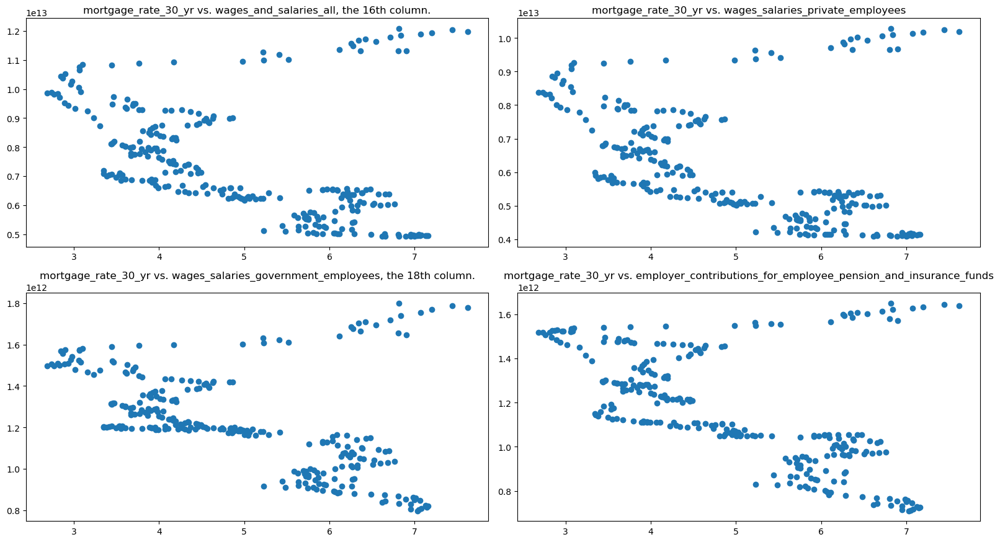

...

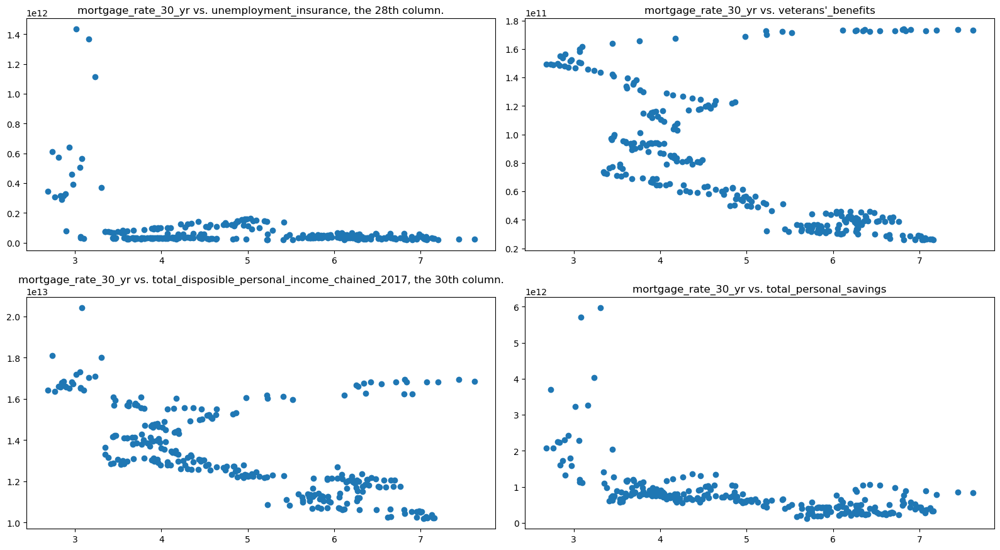

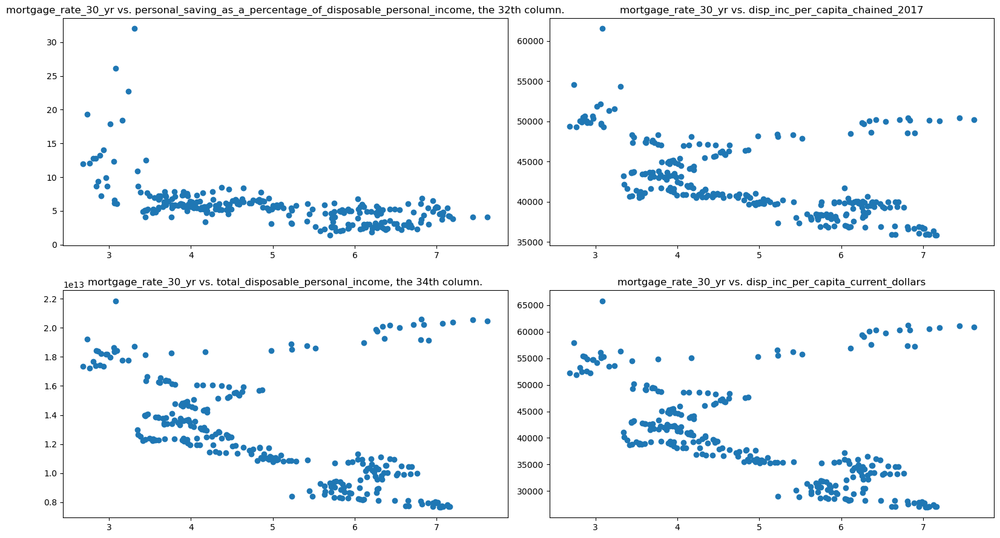

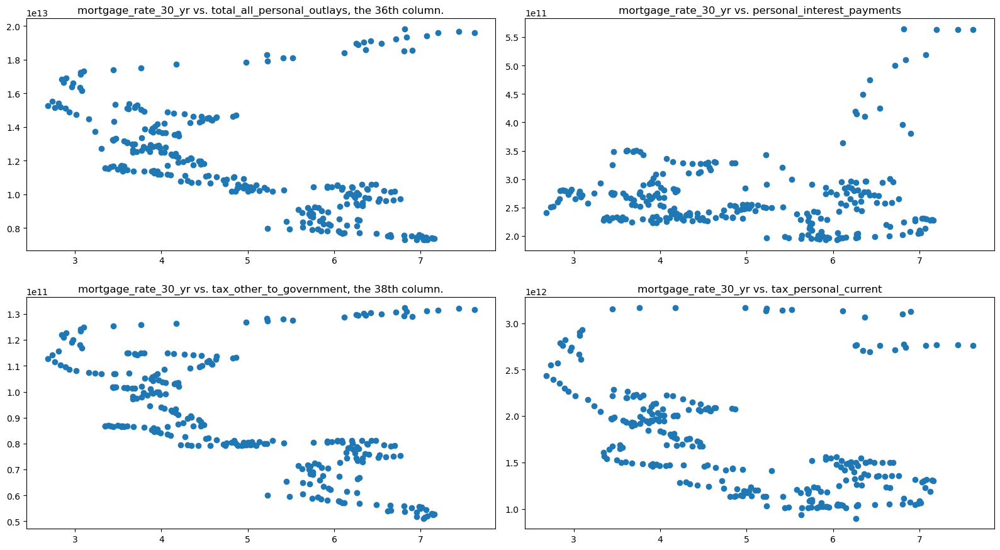

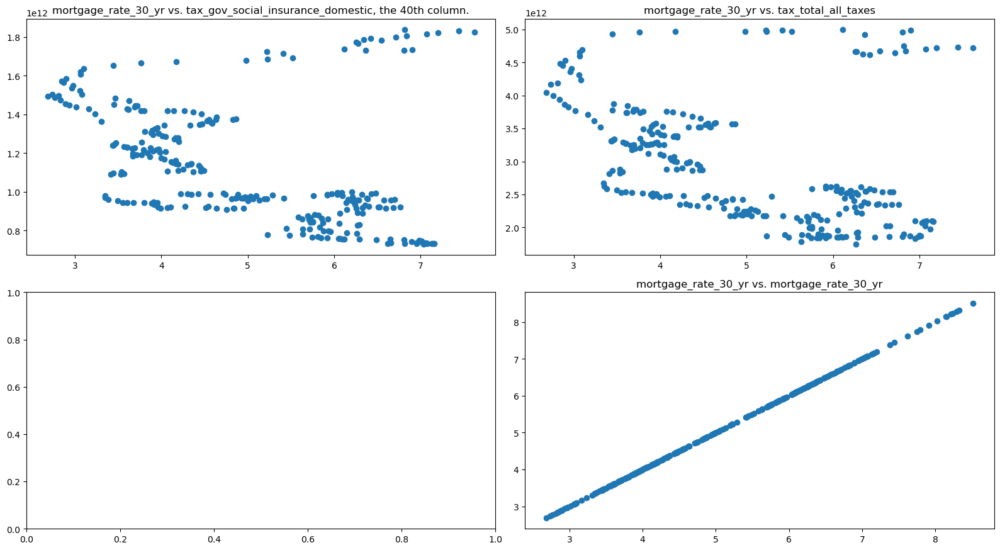

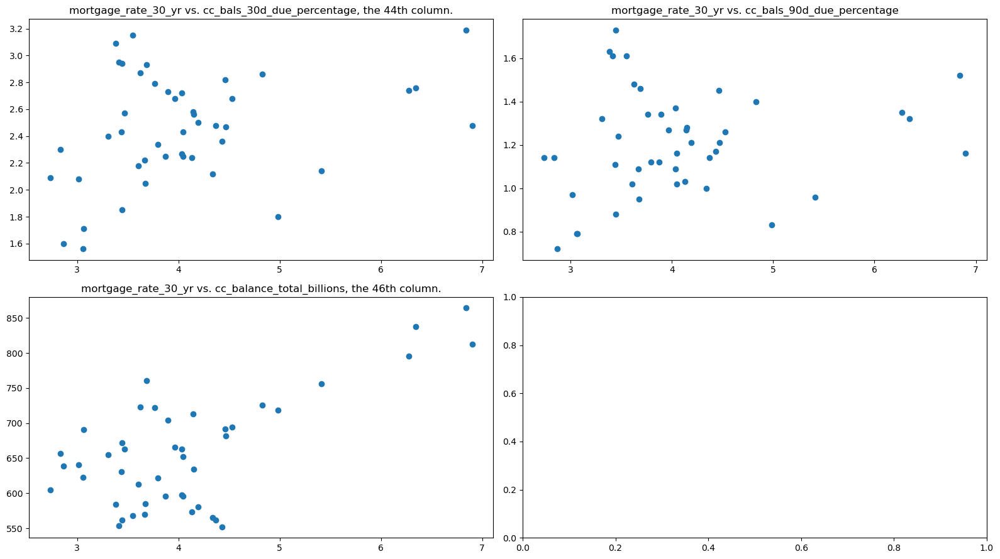

In [60]:
scatter_looker(df, 43)

In [64]:
corr_looker(df, 44)

-0.6470229340194396 is cc_bals_30d_due_percentage's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
unemployment_rate          -0.061295
medical_care_yoy            0.096295
personal_interest_income    0.049089
Name: cc_bals_30d_due_percentage, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
cc_bals_30d_due_percentage    1.000000
cc_bals_90d_due_percentage    0.958649
Name: cc_bals_30d_due_percentage, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
new_&_used_vehicles_yoy   -0.647023
Name: cc_bals_30d_due_percentage, dtype: float64


In [ ]:
scatter_looker(df, 44)

In [65]:
corr_looker(df, 45)

-0.6031378708630409 is cc_bals_90d_due_percentage's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
unemployment_rate                                                0.086492
shelter_yoy                                                      0.022422
personal_interest_income                                        -0.029436
total_personal_savings                                          -0.071995
personal_saving_as_a_percentage_of_disposable_personal_income   -0.028736
Name: cc_bals_90d_due_percentage, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
cc_bals_30d_due_percentage    0.958649
cc_bals_90d_due_percentage    1.000000
Name: cc_bals_90d_due_percentage, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
new_&_used_vehicles_yoy   -0.603138
Name: cc_bals_90d_due_percentage, dtype: float64


In [ ]:
scatter_looker(df, 45)

In [103]:
corr_looker(df, 46)

-0.54953426659262 is cc_balance_total_billions's minimum correlation with all_less_food_&_shelter_yoy
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
medical_care_yoy         -0.082524
total_personal_savings   -0.001316
Name: cc_balance_total_billions, dtype: float64
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
year                                                               0.807940
population                                                         0.821190
hourly_earnings_yoy                                                0.546516
cpi_yoy                                                            0.570270
shelter_yoy                                                        0.822509
food_yoy                                                           0.569099
total_personal_income                                              0.770381
total_employee_compensation                                        0.852071
wages_and_salaries_all                                             0.850368
wage

In [ ]:
pd.corr

Plots for the 0 cluster:
``````````````````````````
``````````````````````````
Plots for the 1 cluster:
``````````````````````````
``````````````````````````
Plots for the 2 cluster:
``````````````````````````
``````````````````````````
Plots for the 3 cluster:
``````````````````````````
``````````````````````````
Plots for the 4 cluster:
``````````````````````````
``````````````````````````
Plots for the 5 cluster:
``````````````````````````
``````````````````````````
Plots for the 6 cluster:
``````````````````````````
``````````````````````````
Plots for the 7 cluster:
``````````````````````````
``````````````````````````
Plots for the 8 cluster:
``````````````````````````
``````````````````````````
Plots for the 9 cluster:
``````````````````````````
``````````````````````````
Plots for the 10 cluster:
``````````````````````````
``````````````````````````
Plots for the 11 cluster:
``````````````````````````
``````````````````````````


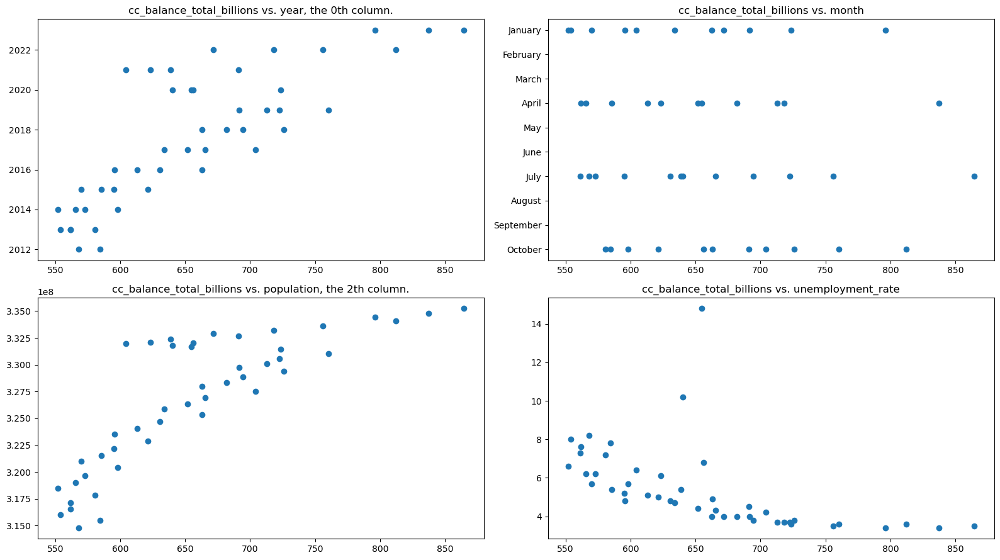

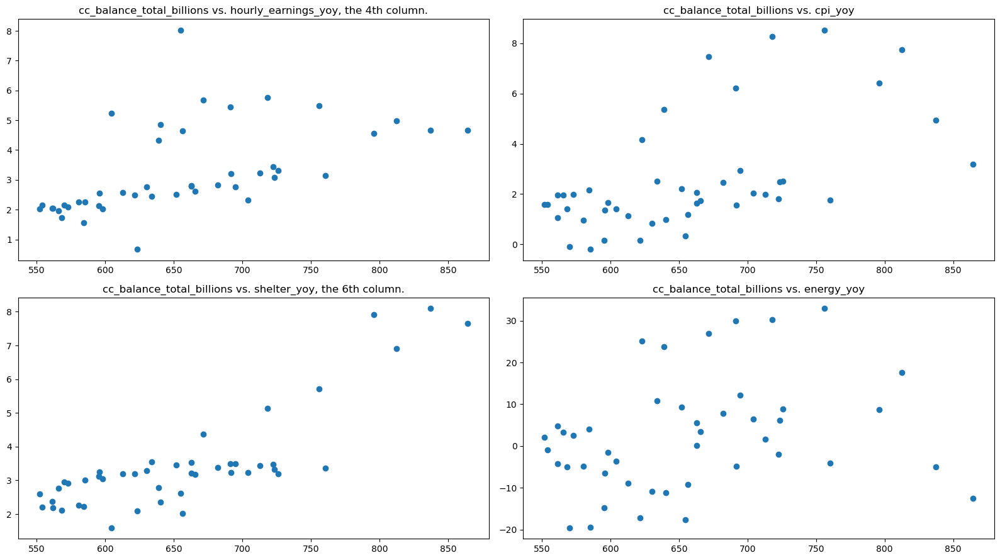

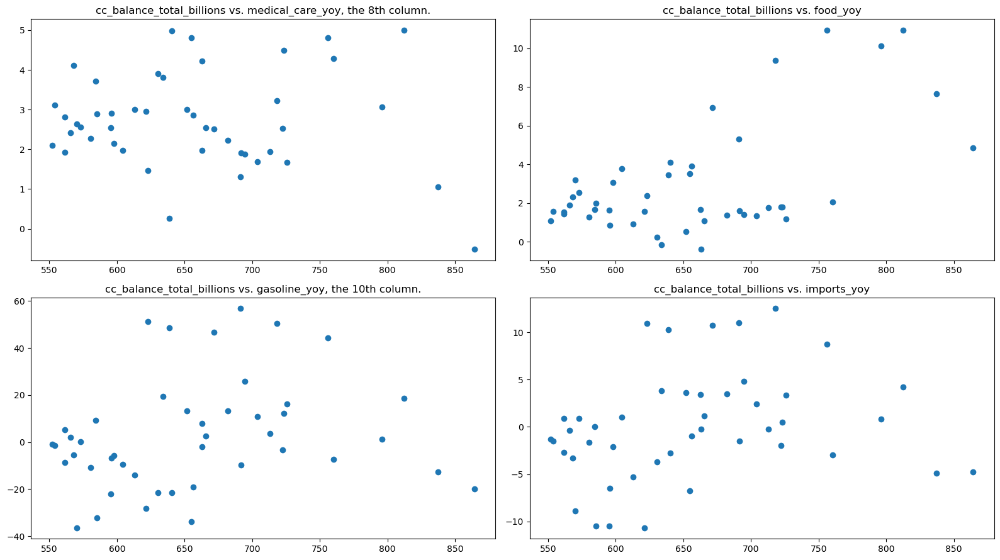

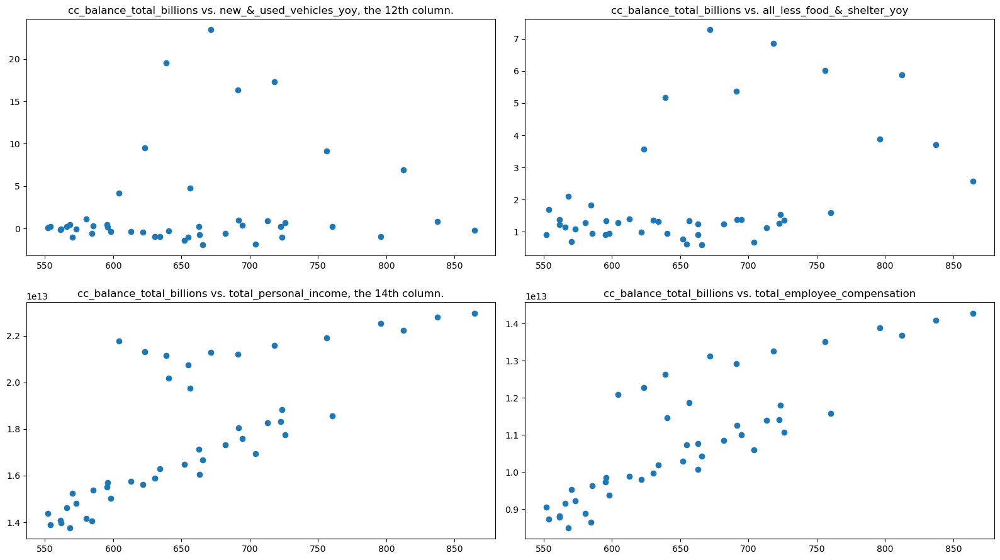

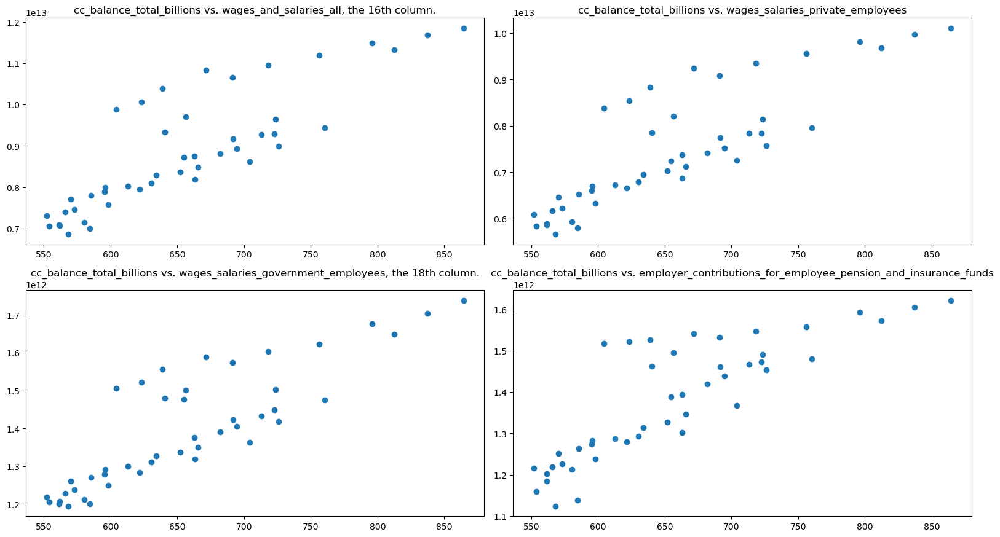

...

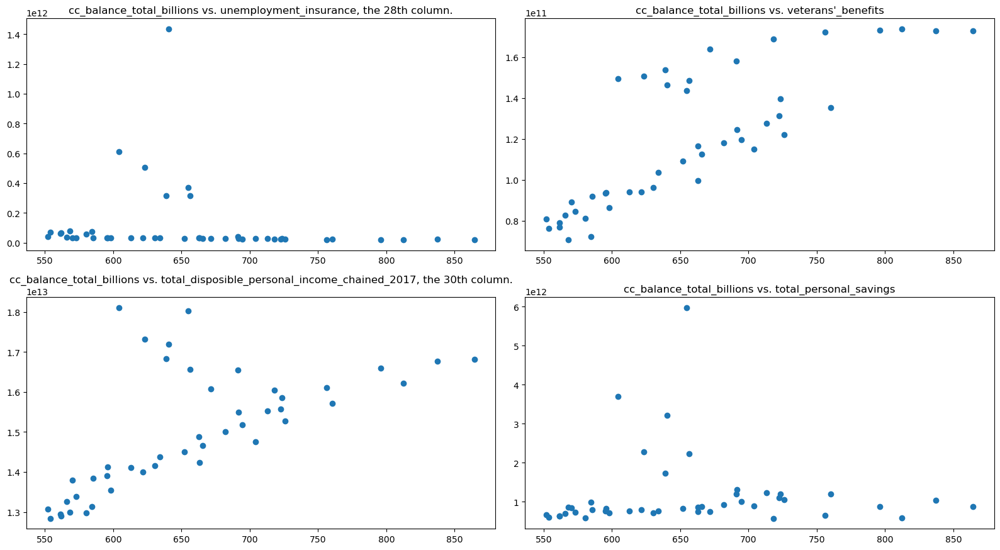

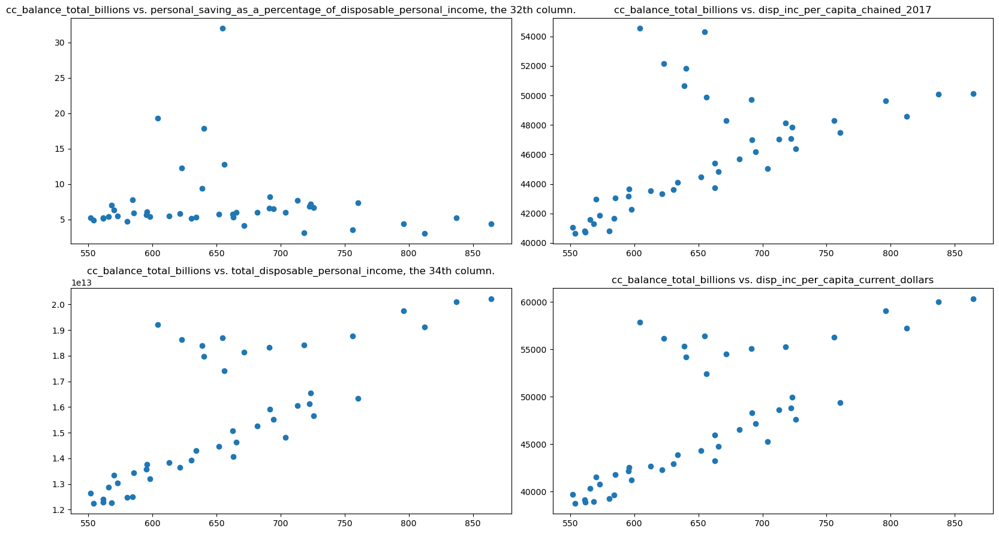

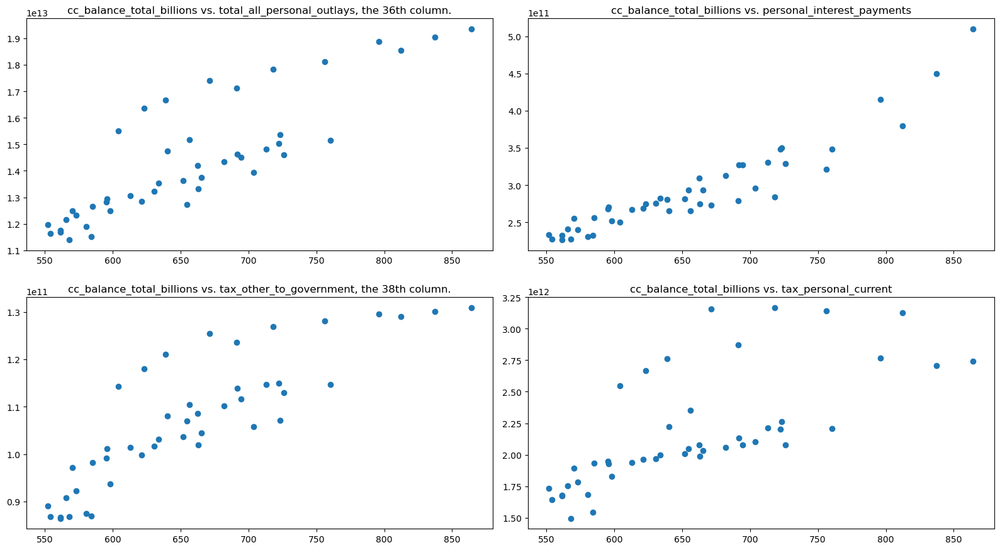

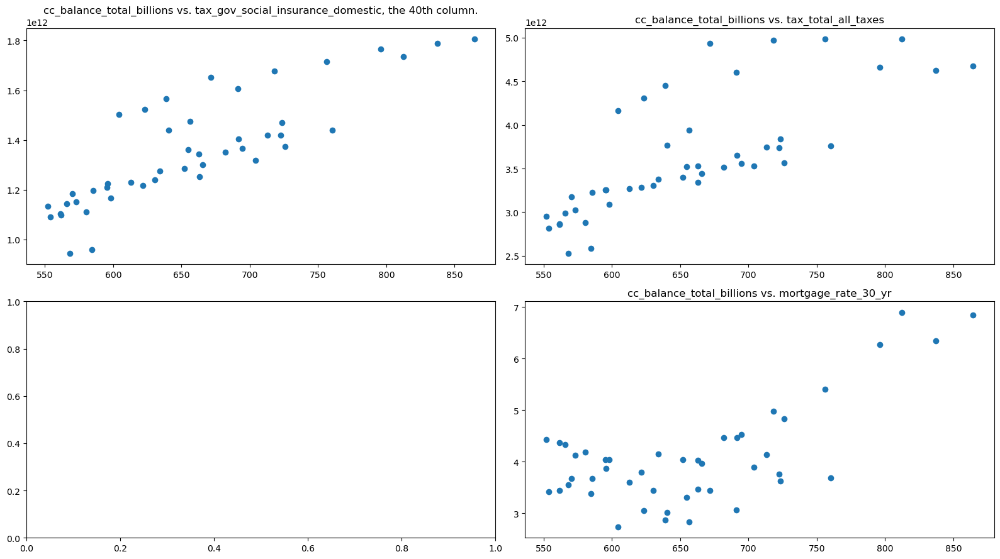

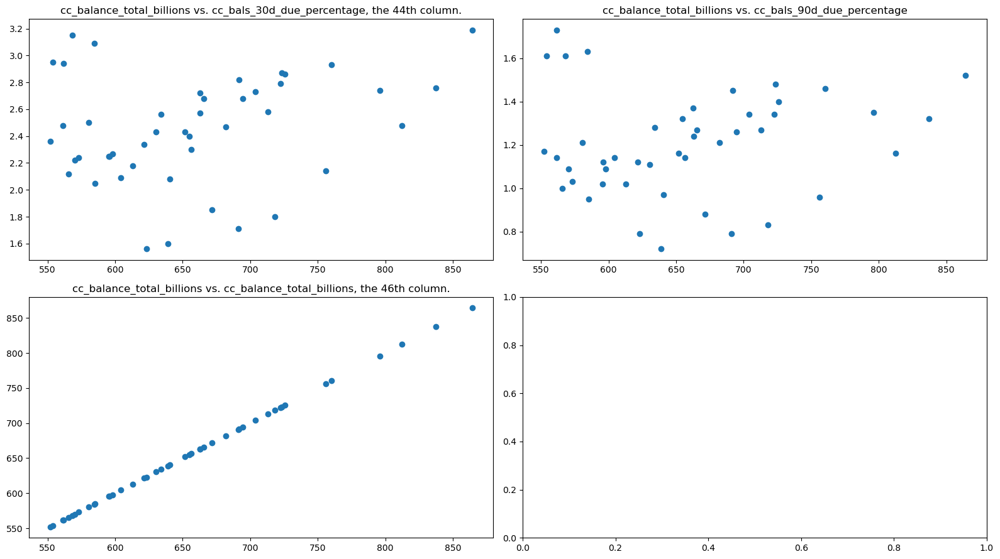

In [68]:
scatter_looker(df, 46)